# Model

In [1]:
#from __future__ import generators, division, absolute_import, with_statement, print_function, unicode_literals

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import tensorflow.contrib.slim as slim

flags = tf.app.flags
FLAGS = flags.FLAGS

def mnist_model(input, reuse=False):
    with tf.name_scope("model"):
        with tf.variable_scope("conv1") as scope:
            net = tf.contrib.layers.conv2d(input, 32, [7, 7], activation_fn=tf.nn.relu, padding='SAME',
                weights_initializer=tf.contrib.layers.xavier_initializer_conv2d(),scope=scope,reuse=reuse)
            net = tf.contrib.layers.max_pool2d(net, [2, 2], padding='SAME')

        with tf.variable_scope("conv2") as scope:
            net = tf.contrib.layers.conv2d(net, 64, [5, 5], activation_fn=tf.nn.relu, padding='SAME',
                weights_initializer=tf.contrib.layers.xavier_initializer_conv2d(),scope=scope,reuse=reuse)
            net = tf.contrib.layers.max_pool2d(net, [2, 2], padding='SAME')

        with tf.variable_scope("conv3") as scope:
            net = tf.contrib.layers.conv2d(net, 128, [3, 3], activation_fn=tf.nn.relu, padding='SAME',
                weights_initializer=tf.contrib.layers.xavier_initializer_conv2d(),scope=scope,reuse=reuse)
            net = tf.contrib.layers.max_pool2d(net, [2, 2], padding='SAME')

        with tf.variable_scope("conv4") as scope:
            net = tf.contrib.layers.conv2d(net, 256, [1, 1], activation_fn=tf.nn.relu, padding='SAME',
                weights_initializer=tf.contrib.layers.xavier_initializer_conv2d(),scope=scope,reuse=reuse)
            net = tf.contrib.layers.max_pool2d(net, [2, 2], padding='SAME')

        with tf.variable_scope("conv5") as scope:
            net = tf.contrib.layers.conv2d(net, 2, [1, 1], activation_fn=None, padding='SAME',
                weights_initializer=tf.contrib.layers.xavier_initializer_conv2d(),scope=scope,reuse=reuse)
            net = tf.contrib.layers.max_pool2d(net, [2, 2], padding='SAME')

        net = tf.contrib.layers.flatten(net)
    
    return net


def contrastive_loss(model1, model2, y, margin):
    with tf.name_scope("contrastive-loss"):
        distance = tf.sqrt(tf.reduce_sum(tf.pow(model1 - model2, 2), 1, keepdims=True))
        similarity = y * tf.square(distance)                                           # keep the similar label (1) close to each other
        dissimilarity = (1 - y) * tf.square(tf.maximum((margin - distance), 0))        # give penalty to dissimilar label if the distance is bigger than margin
        return tf.reduce_mean(dissimilarity + similarity) / 2


---

# Dataset

===Loading MNIST Dataset===
Images train : (60000, 28, 28, 1)
Labels train : (60000, 1)
Images test  : (10000, 28, 28, 1)
Labels test  : (10000,)
Unique label : [0 1 2 3 4 5 6 7 8 9]
Row 0 Label: dissimilar
max: 1.0
Row 1 Label: dissimilar
max: 1.0
Row 2 Label: similar
max: 1.0
Row 3 Label: dissimilar
max: 1.0


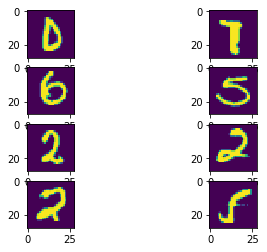

In [2]:
#from __future__ import generators, division, absolute_import, with_statement, print_function, unicode_literals

import numpy as np
import matplotlib.pyplot as plt
from tensorflow.keras.datasets import mnist

class Dataset(object):
    images_train = np.array([])
    images_test = np.array([])
    labels_train = np.array([])
    labels_test = np.array([])
    unique_train_label = np.array([])
    map_train_label_indices = dict()

    def _get_siamese_similar_pair(self):
        label =np.random.choice(self.unique_train_label)
        l, r = np.random.choice(self.map_train_label_indices[label], 2, replace=False)
        return l, r, 1

    def _get_siamese_dissimilar_pair(self):
        label_l, label_r = np.random.choice(self.unique_train_label, 2, replace=False)
        l = np.random.choice(self.map_train_label_indices[label_l])
        r = np.random.choice(self.map_train_label_indices[label_r])
        return l, r, 0

    def _get_siamese_pair(self):
        if np.random.random() < 0.5:
            return self._get_siamese_similar_pair()
        else:
            return self._get_siamese_dissimilar_pair()

    def get_siamese_batch(self, n):
        idxs_left, idxs_right, labels = [], [], []
        for _ in range(n):
            l, r, x = self._get_siamese_pair()
            idxs_left.append(l)
            idxs_right.append(r)
            labels.append(x)
        return self.images_train[idxs_left,:], self.images_train[idxs_right, :], np.expand_dims(labels, axis=1)

class MNISTDataset(Dataset):
    def __init__(self):
        print("===Loading MNIST Dataset===")
        (self.images_train, self.labels_train), (self.images_test, self.labels_test) = mnist.load_data()
        self.images_train = np.expand_dims(self.images_train, axis=3) / 255.0
        self.images_test = np.expand_dims(self.images_test, axis=3) / 255.0
        self.labels_train = np.expand_dims(self.labels_train, axis=1)
        self.unique_train_label = np.unique(self.labels_train)
        self.map_train_label_indices = {label: np.flatnonzero(self.labels_train == label) for label in self.unique_train_label}
        print("Images train :", self.images_train.shape)
        print("Labels train :", self.labels_train.shape)
        print("Images test  :", self.images_test.shape)
        print("Labels test  :", self.labels_test.shape)
        print("Unique label :", self.unique_train_label)
        # print("Map label indices:", self.map_train_label_indices)
        
if __name__ == "__main__":
    # Test if it can load the dataset properly or not. use the train.py to run the training
    a = MNISTDataset()
    batch_size = 4
    ls, rs, xs = a.get_siamese_batch(batch_size)
    
    f, axarr = plt.subplots(batch_size, 2)
    for idx, (l, r, x) in enumerate(zip(ls, rs, xs)):
        print("Row", idx, "Label:", "similar" if x else "dissimilar")
        print("max:", np.squeeze(l, axis=2).max())
        axarr[idx, 0].imshow(np.squeeze(l, axis=2))
        axarr[idx, 1].imshow(np.squeeze(r, axis=2))
    plt.show()

---

# Train

===Loading MNIST Dataset===
Images train : (60000, 28, 28, 1)
Labels train : (60000, 1)
Images test  : (10000, 28, 28, 1)
Labels test  : (10000,)
Unique label : [0 1 2 3 4 5 6 7 8 9]
placeholder_shape [None, 28, 28, 1]
#0 - Loss 0.05456255
#1 - Loss 0.057010412
#2 - Loss 0.06050526
#3 - Loss 0.057798285
#4 - Loss 0.056429505
#5 - Loss 0.058651626
#6 - Loss 0.055291988
#7 - Loss 0.05625723
#8 - Loss 0.056408983
#9 - Loss 0.055799447
#10 - Loss 0.05965991
#11 - Loss 0.056074854
#12 - Loss 0.05173608
#13 - Loss 0.057835612
#14 - Loss 0.055971168
#15 - Loss 0.052348226
#16 - Loss 0.052362792
#17 - Loss 0.052745577
#18 - Loss 0.047510747
#19 - Loss 0.052286875
#20 - Loss 0.049757052
#21 - Loss 0.043504823
#22 - Loss 0.04497698
#23 - Loss 0.044522718
#24 - Loss 0.041721147
#25 - Loss 0.041605845
#26 - Loss 0.04208097
#27 - Loss 0.03865615
#28 - Loss 0.038874432
#29 - Loss 0.033595428
#30 - Loss 0.032708704
#31 - Loss 0.031209283
#32 - Loss 0.031144205
#33 - Loss 0.03186816
#34 - Loss 0.03255

/home/jelena/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:2369: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  warnings.warn("This figure includes Axes that are not compatible "


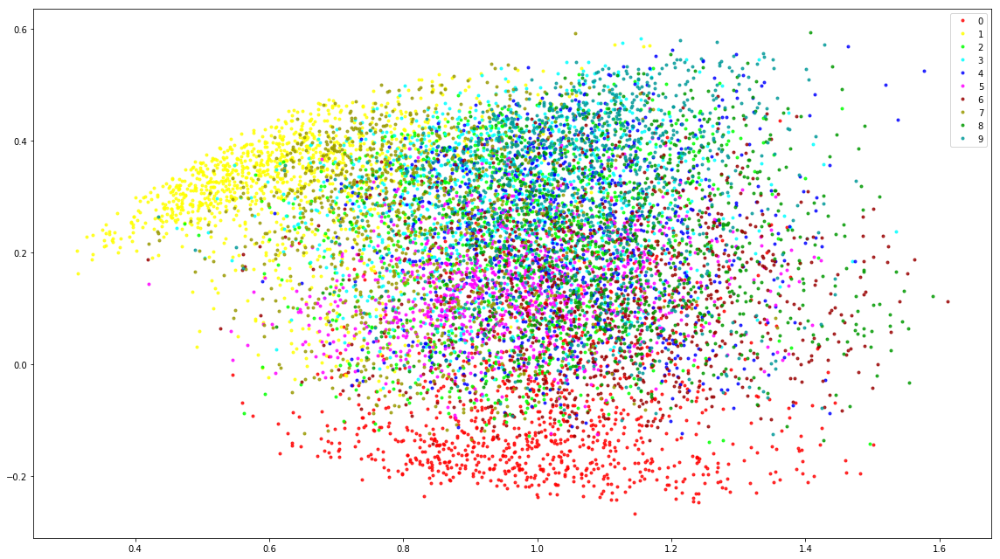

#50 - Loss 0.034615424
#51 - Loss 0.03723015
#52 - Loss 0.030678775
#53 - Loss 0.031849932
#54 - Loss 0.031316765
#55 - Loss 0.030528871
#56 - Loss 0.030762138
#57 - Loss 0.029287666
#58 - Loss 0.029170668
#59 - Loss 0.03111276
#60 - Loss 0.029921336
#61 - Loss 0.030143626
#62 - Loss 0.03118024
#63 - Loss 0.030601824
#64 - Loss 0.031153772
#65 - Loss 0.031221349
#66 - Loss 0.034575246
#67 - Loss 0.03171334
#68 - Loss 0.032286275
#69 - Loss 0.031049158
#70 - Loss 0.029958073
#71 - Loss 0.029564522
#72 - Loss 0.03045739
#73 - Loss 0.029079411
#74 - Loss 0.029933266
#75 - Loss 0.030291056
#76 - Loss 0.031771805
#77 - Loss 0.03038051
#78 - Loss 0.030865185
#79 - Loss 0.030130928
#80 - Loss 0.028742235
#81 - Loss 0.029757101
#82 - Loss 0.028596697
#83 - Loss 0.028702531
#84 - Loss 0.026269874
#85 - Loss 0.028152248
#86 - Loss 0.028186169
#87 - Loss 0.027361885
#88 - Loss 0.027172718
#89 - Loss 0.027363567
#90 - Loss 0.02895059
#91 - Loss 0.02615966
#92 - Loss 0.028478885
#93 - Loss 0.026352

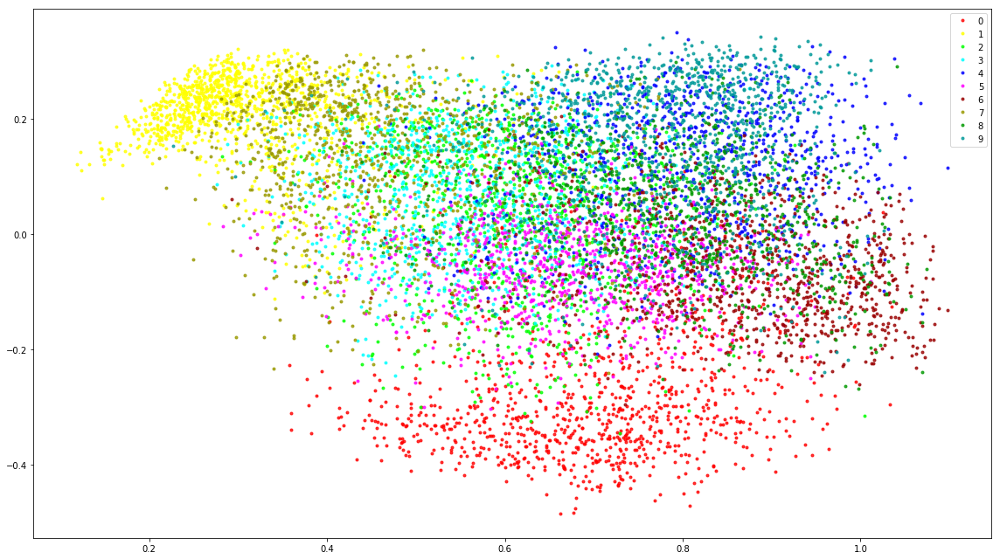

#100 - Loss 0.02331002
#101 - Loss 0.023664236
#102 - Loss 0.0263347
#103 - Loss 0.028401008
#104 - Loss 0.0260694
#105 - Loss 0.02431586
#106 - Loss 0.025390688
#107 - Loss 0.023261756
#108 - Loss 0.024444548
#109 - Loss 0.02377018
#110 - Loss 0.022733545
#111 - Loss 0.02344555
#112 - Loss 0.02311629
#113 - Loss 0.022590436
#114 - Loss 0.023903066
#115 - Loss 0.023788378
#116 - Loss 0.023277622
#117 - Loss 0.021214593
#118 - Loss 0.022865383
#119 - Loss 0.023797974
#120 - Loss 0.024089433
#121 - Loss 0.021702236
#122 - Loss 0.022508327
#123 - Loss 0.021368193
#124 - Loss 0.021429207
#125 - Loss 0.019516038
#126 - Loss 0.020914195
#127 - Loss 0.020682424
#128 - Loss 0.019801592
#129 - Loss 0.022424446
#130 - Loss 0.020536315
#131 - Loss 0.018098446
#132 - Loss 0.020330824
#133 - Loss 0.018646192
#134 - Loss 0.020843491
#135 - Loss 0.020039149
#136 - Loss 0.021557653
#137 - Loss 0.018733675
#138 - Loss 0.021338701
#139 - Loss 0.020825632
#140 - Loss 0.01914327
#141 - Loss 0.019762399
#1

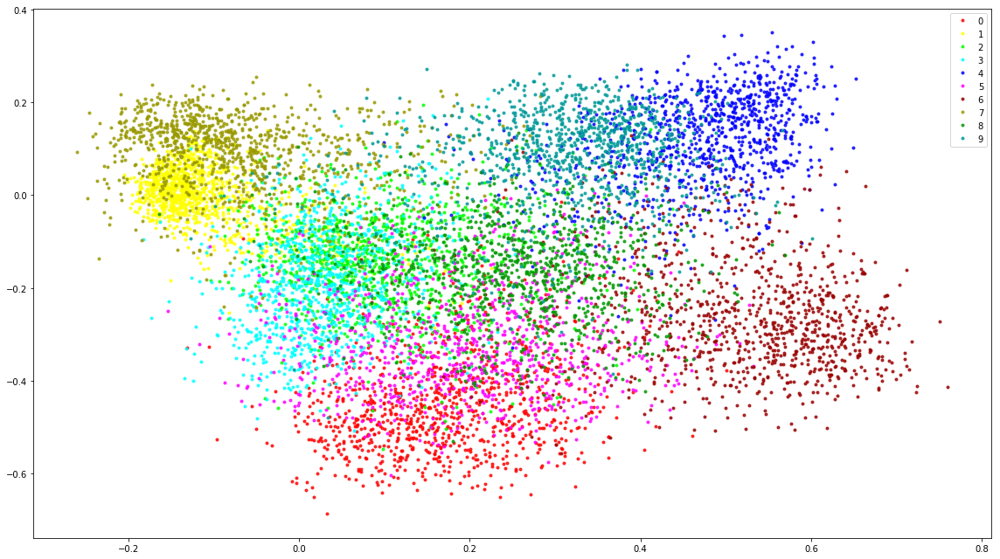

#150 - Loss 0.018441651
#151 - Loss 0.018196374
#152 - Loss 0.018889738
#153 - Loss 0.01771842
#154 - Loss 0.018956974
#155 - Loss 0.016903574
#156 - Loss 0.019185375
#157 - Loss 0.018291702
#158 - Loss 0.020386055
#159 - Loss 0.018671766
#160 - Loss 0.018818755
#161 - Loss 0.018025719
#162 - Loss 0.019062344
#163 - Loss 0.01769476
#164 - Loss 0.016157022
#165 - Loss 0.01857141
#166 - Loss 0.018797142
#167 - Loss 0.016676651
#168 - Loss 0.016813848
#169 - Loss 0.017186878
#170 - Loss 0.016271792
#171 - Loss 0.017949838
#172 - Loss 0.016600307
#173 - Loss 0.016313098
#174 - Loss 0.018299254
#175 - Loss 0.018015759
#176 - Loss 0.017406696
#177 - Loss 0.01584158
#178 - Loss 0.017902559
#179 - Loss 0.016648866
#180 - Loss 0.017921599
#181 - Loss 0.015981624
#182 - Loss 0.015832994
#183 - Loss 0.01640981
#184 - Loss 0.016996918
#185 - Loss 0.017067757
#186 - Loss 0.01785868
#187 - Loss 0.01852864
#188 - Loss 0.015073091
#189 - Loss 0.016387284
#190 - Loss 0.016441533
#191 - Loss 0.017381247

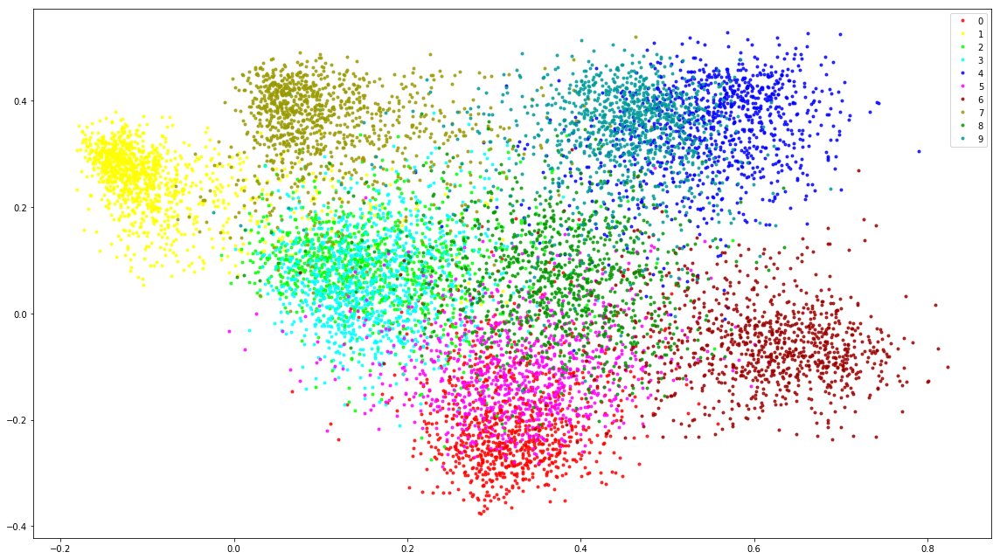

#200 - Loss 0.015612834
#201 - Loss 0.016464384
#202 - Loss 0.01532291
#203 - Loss 0.016145358
#204 - Loss 0.015866555
#205 - Loss 0.014597179
#206 - Loss 0.014174834
#207 - Loss 0.015792765
#208 - Loss 0.015459059
#209 - Loss 0.017431656
#210 - Loss 0.015586761
#211 - Loss 0.015014403
#212 - Loss 0.0153631605
#213 - Loss 0.015685007
#214 - Loss 0.017678311
#215 - Loss 0.01645993
#216 - Loss 0.016715819
#217 - Loss 0.016875114
#218 - Loss 0.015441687
#219 - Loss 0.01511134
#220 - Loss 0.016302137
#221 - Loss 0.015881034
#222 - Loss 0.014693208
#223 - Loss 0.014153321
#224 - Loss 0.014873405
#225 - Loss 0.015070571
#226 - Loss 0.0134635605
#227 - Loss 0.014251991
#228 - Loss 0.014245274
#229 - Loss 0.013595249
#230 - Loss 0.014643039
#231 - Loss 0.015560321
#232 - Loss 0.014114303
#233 - Loss 0.016176805
#234 - Loss 0.013516395
#235 - Loss 0.01489984
#236 - Loss 0.014941472
#237 - Loss 0.016153485
#238 - Loss 0.013244418
#239 - Loss 0.012776835
#240 - Loss 0.013594849
#241 - Loss 0.0157

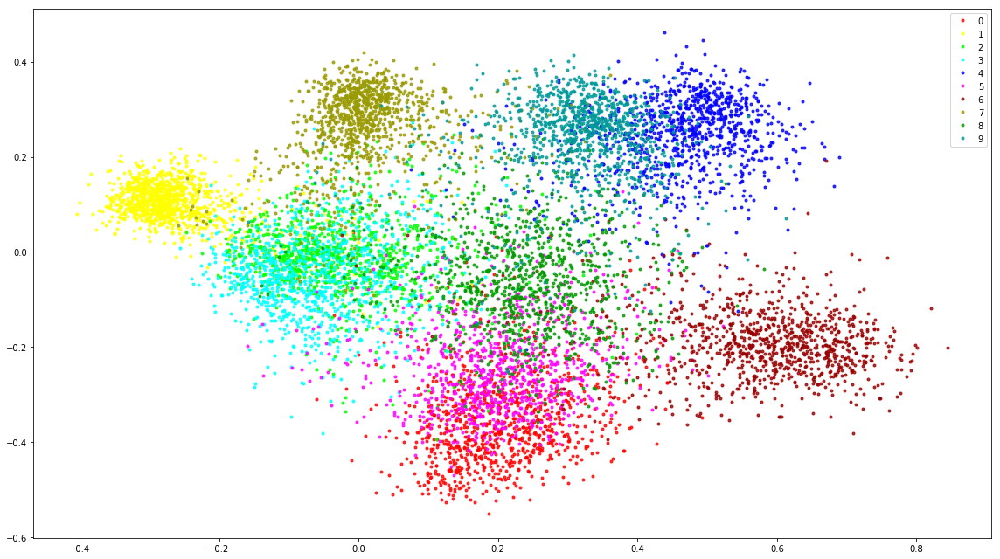

#250 - Loss 0.013925781
#251 - Loss 0.013161396
#252 - Loss 0.016391719
#253 - Loss 0.014497396
#254 - Loss 0.014500586
#255 - Loss 0.01549113
#256 - Loss 0.014303938
#257 - Loss 0.014755302
#258 - Loss 0.014414394
#259 - Loss 0.014091409
#260 - Loss 0.0149425855
#261 - Loss 0.012153662
#262 - Loss 0.015059491
#263 - Loss 0.014638382
#264 - Loss 0.012527993
#265 - Loss 0.014012128
#266 - Loss 0.012344531
#267 - Loss 0.01439146
#268 - Loss 0.015074303
#269 - Loss 0.013192896
#270 - Loss 0.015240412
#271 - Loss 0.014248065
#272 - Loss 0.014593878
#273 - Loss 0.013973203
#274 - Loss 0.013145519
#275 - Loss 0.011564657
#276 - Loss 0.01485642
#277 - Loss 0.012824628
#278 - Loss 0.012070664
#279 - Loss 0.011724094
#280 - Loss 0.013555249
#281 - Loss 0.0143802585
#282 - Loss 0.014034592
#283 - Loss 0.014342215
#284 - Loss 0.014799374
#285 - Loss 0.012682139
#286 - Loss 0.013564768
#287 - Loss 0.012559044
#288 - Loss 0.014833612
#289 - Loss 0.012925669
#290 - Loss 0.012857264
#291 - Loss 0.014

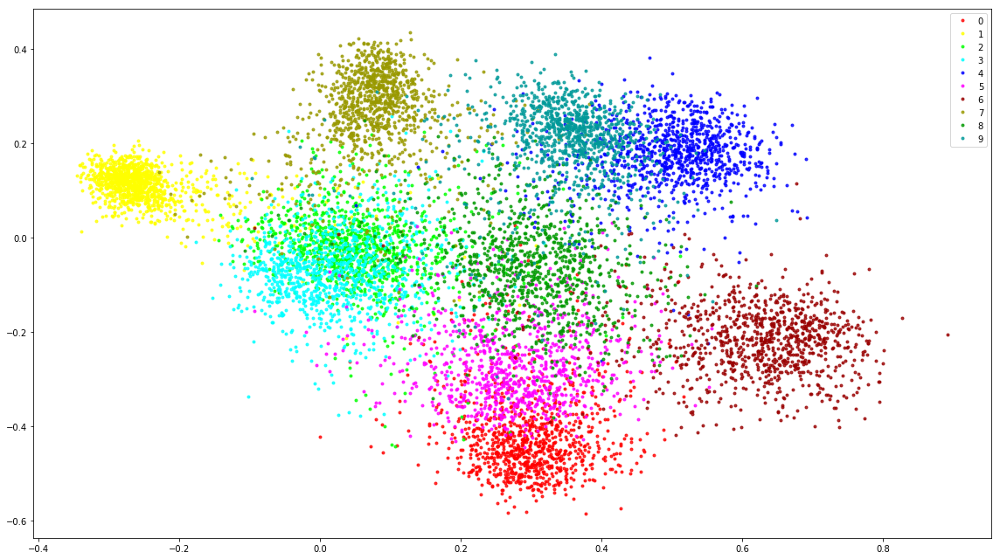

#300 - Loss 0.013231247
#301 - Loss 0.013292531
#302 - Loss 0.012442154
#303 - Loss 0.013145002
#304 - Loss 0.012114171
#305 - Loss 0.013806369
#306 - Loss 0.012874741
#307 - Loss 0.013765371
#308 - Loss 0.014390341
#309 - Loss 0.012298195
#310 - Loss 0.011228121
#311 - Loss 0.013884886
#312 - Loss 0.012628502
#313 - Loss 0.012974138
#314 - Loss 0.012366015
#315 - Loss 0.012614563
#316 - Loss 0.0130772665
#317 - Loss 0.011316824
#318 - Loss 0.014270358
#319 - Loss 0.01341231
#320 - Loss 0.012408944
#321 - Loss 0.013294209
#322 - Loss 0.012716791
#323 - Loss 0.01278904
#324 - Loss 0.012216302
#325 - Loss 0.0125115635
#326 - Loss 0.011868519
#327 - Loss 0.011861818
#328 - Loss 0.011206898
#329 - Loss 0.012445627
#330 - Loss 0.013539775
#331 - Loss 0.0114434585
#332 - Loss 0.0120567735
#333 - Loss 0.011922747
#334 - Loss 0.012771852
#335 - Loss 0.011553759
#336 - Loss 0.013772594
#337 - Loss 0.011825429
#338 - Loss 0.01274589
#339 - Loss 0.012860995
#340 - Loss 0.011714535
#341 - Loss 0.0

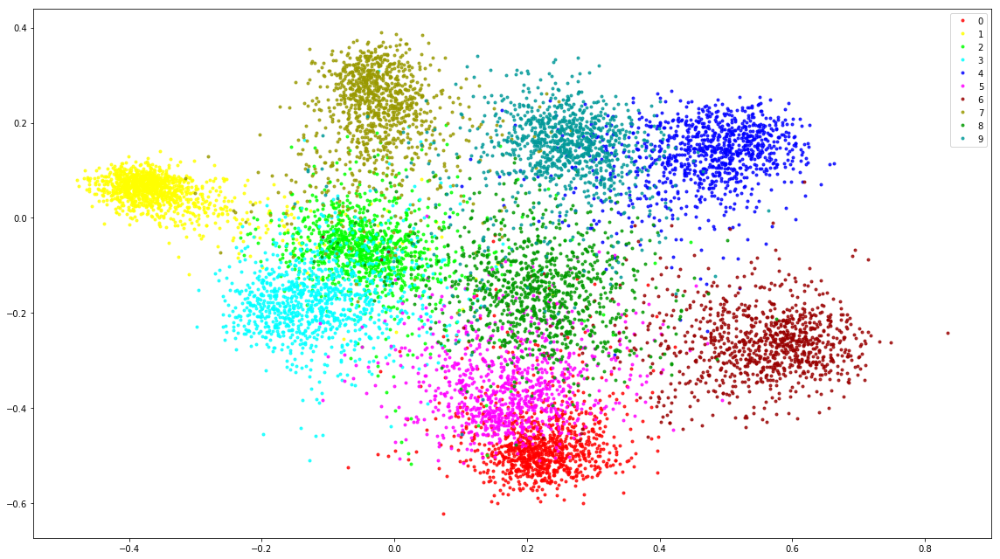

#350 - Loss 0.012399054
#351 - Loss 0.012308225
#352 - Loss 0.013176579
#353 - Loss 0.013602169
#354 - Loss 0.013089791
#355 - Loss 0.011476848
#356 - Loss 0.010796385
#357 - Loss 0.010788228
#358 - Loss 0.0127224075
#359 - Loss 0.011854008
#360 - Loss 0.01158756
#361 - Loss 0.011966014
#362 - Loss 0.012663035
#363 - Loss 0.010898003
#364 - Loss 0.011164312
#365 - Loss 0.012635051
#366 - Loss 0.012214313
#367 - Loss 0.013935702
#368 - Loss 0.011329404
#369 - Loss 0.0111840395
#370 - Loss 0.012593464
#371 - Loss 0.012261468
#372 - Loss 0.011075908
#373 - Loss 0.01236756
#374 - Loss 0.010366021
#375 - Loss 0.011832156
#376 - Loss 0.011142547
#377 - Loss 0.011497286
#378 - Loss 0.011359557
#379 - Loss 0.010129608
#380 - Loss 0.011302938
#381 - Loss 0.01049027
#382 - Loss 0.011270184
#383 - Loss 0.012152919
#384 - Loss 0.011093027
#385 - Loss 0.010625185
#386 - Loss 0.010069012
#387 - Loss 0.01213891
#388 - Loss 0.011427188
#389 - Loss 0.012288706
#390 - Loss 0.012275166
#391 - Loss 0.0119

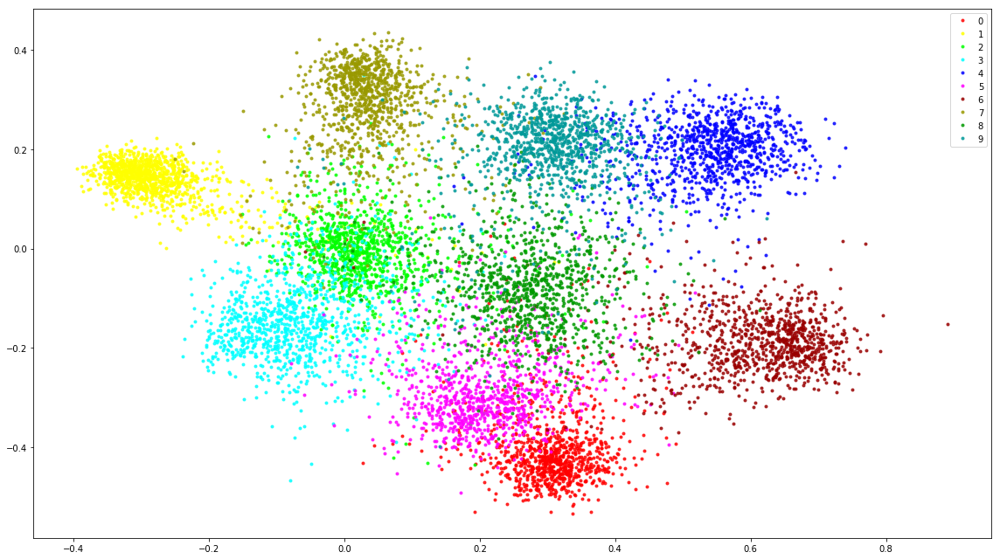

#400 - Loss 0.011358546
#401 - Loss 0.011107391
#402 - Loss 0.010618575
#403 - Loss 0.011728473
#404 - Loss 0.012565713
#405 - Loss 0.012079244
#406 - Loss 0.009361835
#407 - Loss 0.011649214
#408 - Loss 0.011081464
#409 - Loss 0.011817943
#410 - Loss 0.01077975
#411 - Loss 0.0123575255
#412 - Loss 0.010932862
#413 - Loss 0.010004001
#414 - Loss 0.010143848
#415 - Loss 0.011017146
#416 - Loss 0.0108227795
#417 - Loss 0.011972869
#418 - Loss 0.012107171
#419 - Loss 0.011352046
#420 - Loss 0.011424658
#421 - Loss 0.010269341
#422 - Loss 0.011806189
#423 - Loss 0.011031897
#424 - Loss 0.010601799
#425 - Loss 0.010082173
#426 - Loss 0.009885319
#427 - Loss 0.011655729
#428 - Loss 0.010443619
#429 - Loss 0.010683619
#430 - Loss 0.009944948
#431 - Loss 0.0103479205
#432 - Loss 0.011416567
#433 - Loss 0.009986762
#434 - Loss 0.009101903
#435 - Loss 0.010868432
#436 - Loss 0.010302008
#437 - Loss 0.010760086
#438 - Loss 0.012002986
#439 - Loss 0.009567302
#440 - Loss 0.011827829
#441 - Loss 0.

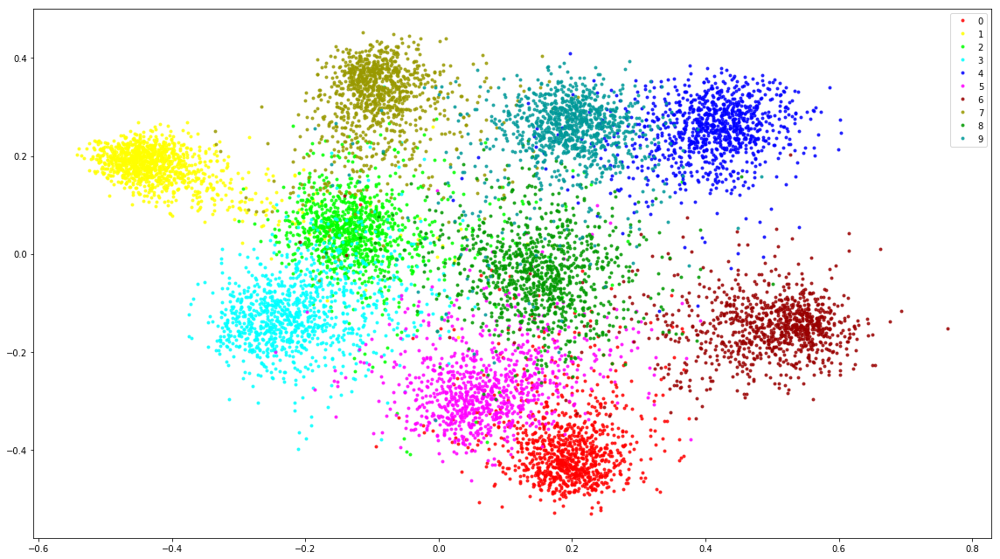

#450 - Loss 0.0117337275
#451 - Loss 0.010934511
#452 - Loss 0.009822998
#453 - Loss 0.012089247
#454 - Loss 0.012482727
#455 - Loss 0.011284243
#456 - Loss 0.011554344
#457 - Loss 0.010308566
#458 - Loss 0.011868381
#459 - Loss 0.009683991
#460 - Loss 0.0096073905
#461 - Loss 0.009372837
#462 - Loss 0.0101100365
#463 - Loss 0.010482524
#464 - Loss 0.010987028
#465 - Loss 0.011354636
#466 - Loss 0.010165793
#467 - Loss 0.010726167
#468 - Loss 0.01045277
#469 - Loss 0.0099854525
#470 - Loss 0.009482663
#471 - Loss 0.010081897
#472 - Loss 0.010448043
#473 - Loss 0.009601554
#474 - Loss 0.0101691345
#475 - Loss 0.012023048
#476 - Loss 0.009354603
#477 - Loss 0.010428523
#478 - Loss 0.01042966
#479 - Loss 0.011706889
#480 - Loss 0.009950177
#481 - Loss 0.010706611
#482 - Loss 0.010561885
#483 - Loss 0.008941831
#484 - Loss 0.009789113
#485 - Loss 0.01068334
#486 - Loss 0.010015846
#487 - Loss 0.010161982
#488 - Loss 0.01152583
#489 - Loss 0.011906128
#490 - Loss 0.0095694885
#491 - Loss 0.

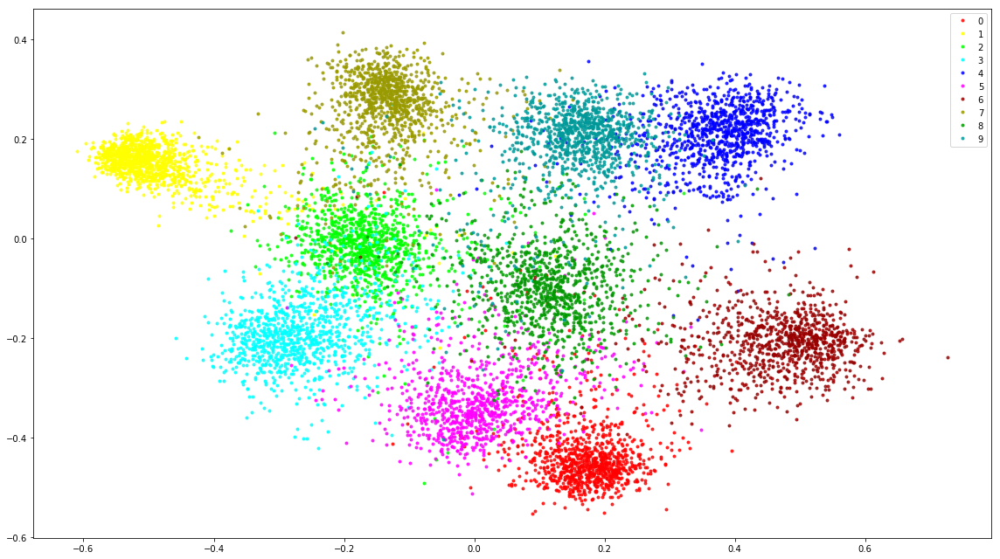

#500 - Loss 0.009568919
#501 - Loss 0.007946481
#502 - Loss 0.009287655
#503 - Loss 0.0091221
#504 - Loss 0.009968412
#505 - Loss 0.00917098
#506 - Loss 0.010282728
#507 - Loss 0.009352226
#508 - Loss 0.009931548
#509 - Loss 0.010053935
#510 - Loss 0.01037835
#511 - Loss 0.008746172
#512 - Loss 0.008769715
#513 - Loss 0.009544011
#514 - Loss 0.010507142
#515 - Loss 0.010824872
#516 - Loss 0.01014882
#517 - Loss 0.008983793
#518 - Loss 0.009458229
#519 - Loss 0.00999026
#520 - Loss 0.009252682
#521 - Loss 0.008592607
#522 - Loss 0.009178183
#523 - Loss 0.01163817
#524 - Loss 0.009628964
#525 - Loss 0.009761968
#526 - Loss 0.009559155
#527 - Loss 0.010473065
#528 - Loss 0.008603854
#529 - Loss 0.009194458
#530 - Loss 0.009475509
#531 - Loss 0.010804592
#532 - Loss 0.009119213
#533 - Loss 0.009024819
#534 - Loss 0.010331978
#535 - Loss 0.008419623
#536 - Loss 0.009674952
#537 - Loss 0.009637151
#538 - Loss 0.010516161
#539 - Loss 0.009887275
#540 - Loss 0.010949098
#541 - Loss 0.011037894

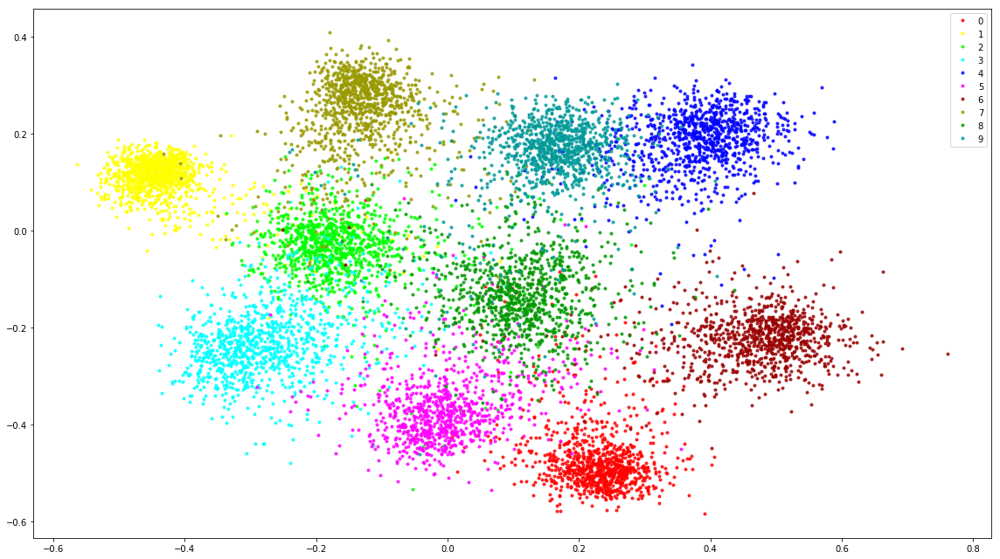

#550 - Loss 0.009913371
#551 - Loss 0.009516723
#552 - Loss 0.009359331
#553 - Loss 0.008910695
#554 - Loss 0.008751647
#555 - Loss 0.009688115
#556 - Loss 0.008221753
#557 - Loss 0.010035108
#558 - Loss 0.0100087095
#559 - Loss 0.009919344
#560 - Loss 0.009677886
#561 - Loss 0.009966052
#562 - Loss 0.010618141
#563 - Loss 0.007726251
#564 - Loss 0.010236757
#565 - Loss 0.009925921
#566 - Loss 0.01005379
#567 - Loss 0.010407265
#568 - Loss 0.009876447
#569 - Loss 0.010094149
#570 - Loss 0.010537168
#571 - Loss 0.009493481
#572 - Loss 0.008363197
#573 - Loss 0.008230771
#574 - Loss 0.0096805915
#575 - Loss 0.00927015
#576 - Loss 0.010731693
#577 - Loss 0.009667137
#578 - Loss 0.00964139
#579 - Loss 0.00914661
#580 - Loss 0.008375708
#581 - Loss 0.008922994
#582 - Loss 0.010018521
#583 - Loss 0.009184391
#584 - Loss 0.009753304
#585 - Loss 0.009244081
#586 - Loss 0.008295077
#587 - Loss 0.0091209095
#588 - Loss 0.009077835
#589 - Loss 0.009158591
#590 - Loss 0.00942983
#591 - Loss 0.0084

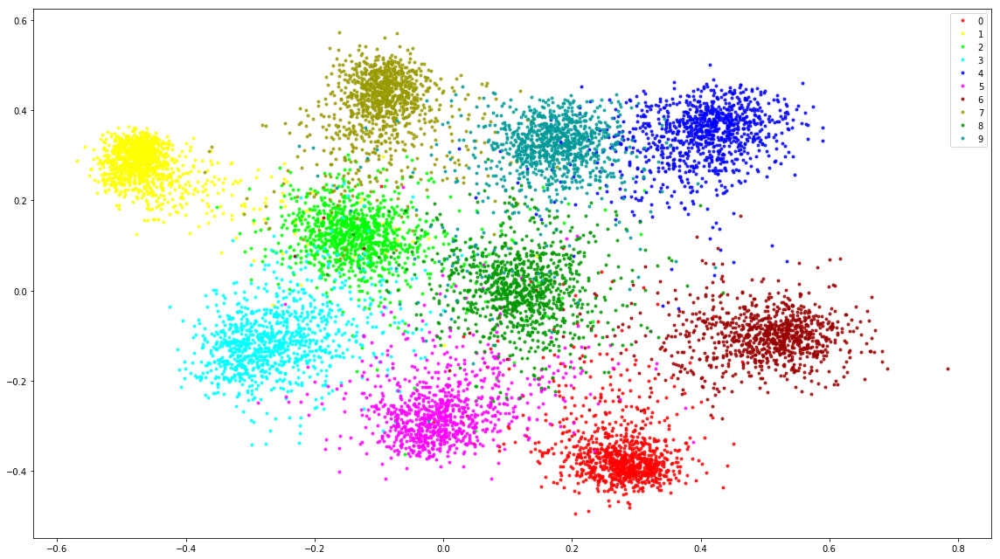

#600 - Loss 0.009639972
#601 - Loss 0.008301735
#602 - Loss 0.007980935
#603 - Loss 0.009390787
#604 - Loss 0.009912247
#605 - Loss 0.008762265
#606 - Loss 0.010315039
#607 - Loss 0.007904791
#608 - Loss 0.008818055
#609 - Loss 0.0108352825
#610 - Loss 0.008668061
#611 - Loss 0.008935879
#612 - Loss 0.008724033
#613 - Loss 0.008882235
#614 - Loss 0.008807836
#615 - Loss 0.008742727
#616 - Loss 0.008864702
#617 - Loss 0.007704612
#618 - Loss 0.00959212
#619 - Loss 0.008306098
#620 - Loss 0.008793289
#621 - Loss 0.009678741
#622 - Loss 0.009052957
#623 - Loss 0.008020844
#624 - Loss 0.009654408
#625 - Loss 0.008081217
#626 - Loss 0.008779796
#627 - Loss 0.009247505
#628 - Loss 0.009069647
#629 - Loss 0.008446142
#630 - Loss 0.007825799
#631 - Loss 0.009334158
#632 - Loss 0.008317364
#633 - Loss 0.009506345
#634 - Loss 0.0091339145
#635 - Loss 0.008392831
#636 - Loss 0.009592034
#637 - Loss 0.009948811
#638 - Loss 0.009003355
#639 - Loss 0.008664619
#640 - Loss 0.008242752
#641 - Loss 0.0

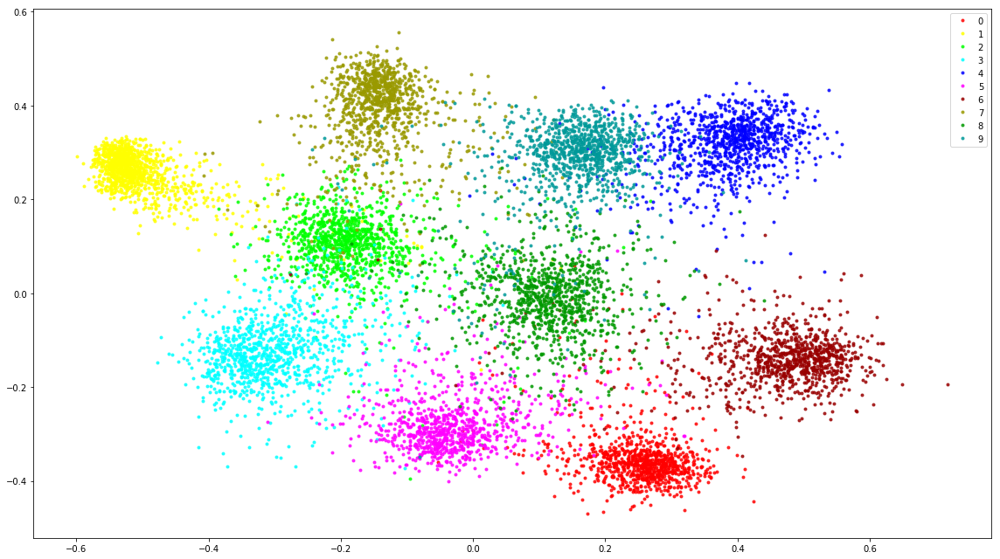

#650 - Loss 0.008543227
#651 - Loss 0.008278732
#652 - Loss 0.008821881
#653 - Loss 0.009361072
#654 - Loss 0.008390528
#655 - Loss 0.008438323
#656 - Loss 0.008149669
#657 - Loss 0.008195101
#658 - Loss 0.009046058
#659 - Loss 0.008377623
#660 - Loss 0.009109873
#661 - Loss 0.008603572
#662 - Loss 0.008155901
#663 - Loss 0.0087151
#664 - Loss 0.008699881
#665 - Loss 0.0089755505
#666 - Loss 0.008601791
#667 - Loss 0.0076052644
#668 - Loss 0.008888306
#669 - Loss 0.009159255
#670 - Loss 0.008758606
#671 - Loss 0.0077612493
#672 - Loss 0.008046465
#673 - Loss 0.008458519
#674 - Loss 0.008960674
#675 - Loss 0.00881624
#676 - Loss 0.007984638
#677 - Loss 0.009592686
#678 - Loss 0.0097324215
#679 - Loss 0.008335786
#680 - Loss 0.008688094
#681 - Loss 0.00796718
#682 - Loss 0.0074202204
#683 - Loss 0.008143591
#684 - Loss 0.00933161
#685 - Loss 0.008915708
#686 - Loss 0.008660137
#687 - Loss 0.00902438
#688 - Loss 0.00963849
#689 - Loss 0.007431994
#690 - Loss 0.007947298
#691 - Loss 0.0083

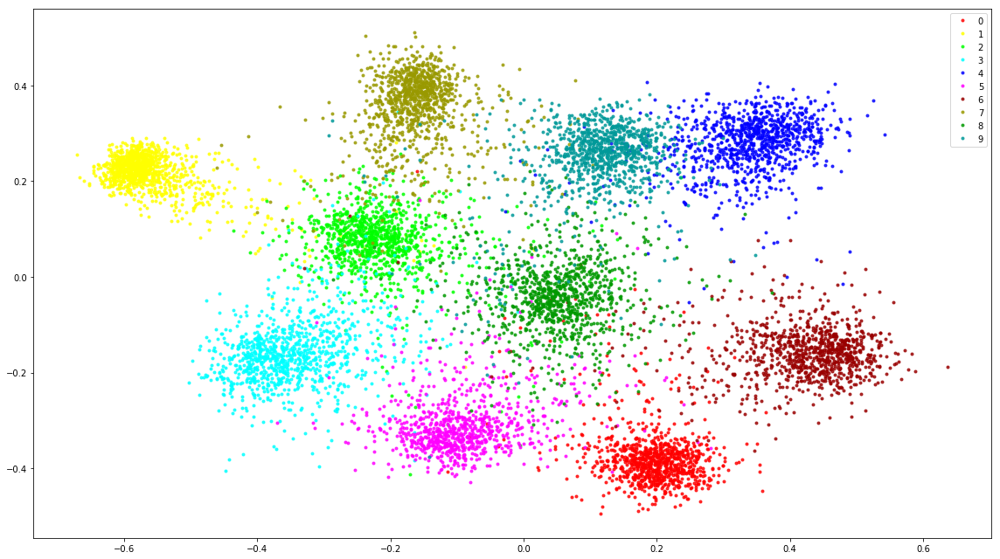

#700 - Loss 0.009170147
#701 - Loss 0.008206232
#702 - Loss 0.008687055
#703 - Loss 0.008513877
#704 - Loss 0.008007739
#705 - Loss 0.008370122
#706 - Loss 0.008257789
#707 - Loss 0.009687373
#708 - Loss 0.00889217
#709 - Loss 0.009264764
#710 - Loss 0.008734161
#711 - Loss 0.008029768
#712 - Loss 0.008139161
#713 - Loss 0.00908383
#714 - Loss 0.007574994
#715 - Loss 0.008875239
#716 - Loss 0.00800042
#717 - Loss 0.00809711
#718 - Loss 0.008211469
#719 - Loss 0.008835921
#720 - Loss 0.008762991
#721 - Loss 0.008429707
#722 - Loss 0.0073540644
#723 - Loss 0.008518744
#724 - Loss 0.009159652
#725 - Loss 0.008508549
#726 - Loss 0.007759926
#727 - Loss 0.008439395
#728 - Loss 0.007968556
#729 - Loss 0.008422124
#730 - Loss 0.007636654
#731 - Loss 0.00852435
#732 - Loss 0.0072898474
#733 - Loss 0.0073867165
#734 - Loss 0.008473057
#735 - Loss 0.00877639
#736 - Loss 0.008372807
#737 - Loss 0.008717089
#738 - Loss 0.009063104
#739 - Loss 0.008802258
#740 - Loss 0.007734106
#741 - Loss 0.00764

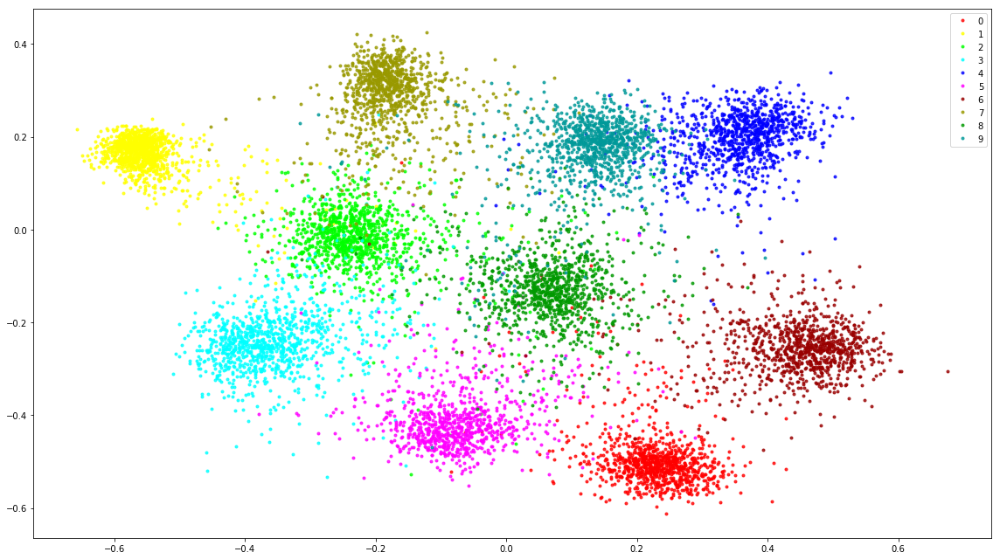

#750 - Loss 0.007834488
#751 - Loss 0.0080738
#752 - Loss 0.009200148
#753 - Loss 0.007766041
#754 - Loss 0.008616004
#755 - Loss 0.007868009
#756 - Loss 0.008763346
#757 - Loss 0.00787853
#758 - Loss 0.009364735
#759 - Loss 0.008084834
#760 - Loss 0.007996221
#761 - Loss 0.007817131
#762 - Loss 0.0073052985
#763 - Loss 0.0083933445
#764 - Loss 0.0072666733
#765 - Loss 0.007595069
#766 - Loss 0.0077615315
#767 - Loss 0.00795904
#768 - Loss 0.008507097
#769 - Loss 0.0080294125
#770 - Loss 0.0075238473
#771 - Loss 0.00802152
#772 - Loss 0.008695447
#773 - Loss 0.0076160748
#774 - Loss 0.0074509685
#775 - Loss 0.007144589
#776 - Loss 0.0077088214
#777 - Loss 0.007941854
#778 - Loss 0.008832126
#779 - Loss 0.008049249
#780 - Loss 0.0087947
#781 - Loss 0.009713241
#782 - Loss 0.008613992
#783 - Loss 0.008057108
#784 - Loss 0.007034054
#785 - Loss 0.008641882
#786 - Loss 0.007839253
#787 - Loss 0.0075089205
#788 - Loss 0.008916208
#789 - Loss 0.008255748
#790 - Loss 0.008144075
#791 - Loss 0

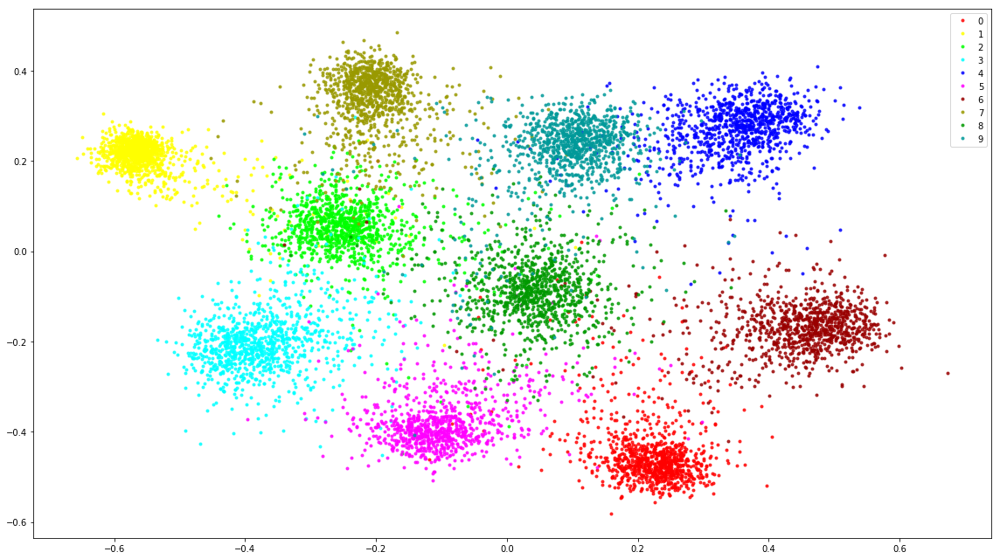

#800 - Loss 0.008966892
#801 - Loss 0.0071681864
#802 - Loss 0.007647583
#803 - Loss 0.00886051
#804 - Loss 0.009480783
#805 - Loss 0.0074557974
#806 - Loss 0.008717315
#807 - Loss 0.007658171
#808 - Loss 0.008273812
#809 - Loss 0.007020428
#810 - Loss 0.0073547177
#811 - Loss 0.0073673837
#812 - Loss 0.008638308
#813 - Loss 0.00780691
#814 - Loss 0.008527968
#815 - Loss 0.0075666597
#816 - Loss 0.0071254135
#817 - Loss 0.008911534
#818 - Loss 0.007966897
#819 - Loss 0.007529131
#820 - Loss 0.007452974
#821 - Loss 0.008092539
#822 - Loss 0.0078018587
#823 - Loss 0.007414435
#824 - Loss 0.007983461
#825 - Loss 0.0075206226
#826 - Loss 0.0077332156
#827 - Loss 0.0072743474
#828 - Loss 0.0074461903
#829 - Loss 0.008283613
#830 - Loss 0.008130037
#831 - Loss 0.006824877
#832 - Loss 0.007149728
#833 - Loss 0.008179543
#834 - Loss 0.007869633
#835 - Loss 0.007943826
#836 - Loss 0.008836772
#837 - Loss 0.007636551
#838 - Loss 0.0077813845
#839 - Loss 0.008004896
#840 - Loss 0.008438465
#841 -

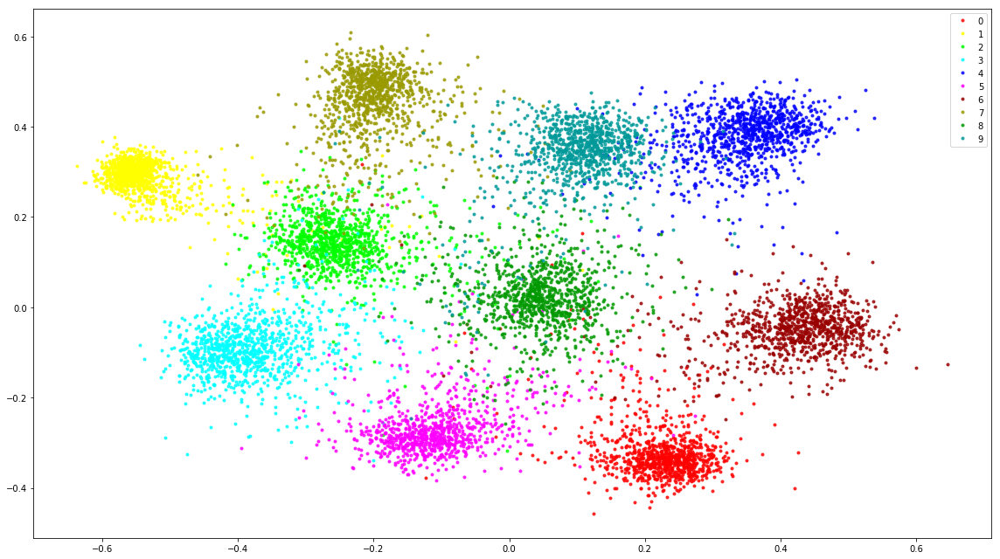

#850 - Loss 0.0072693527
#851 - Loss 0.0066735786
#852 - Loss 0.0070990482
#853 - Loss 0.006669458
#854 - Loss 0.0072929235
#855 - Loss 0.008151747
#856 - Loss 0.0077753505
#857 - Loss 0.008366354
#858 - Loss 0.0080182385
#859 - Loss 0.007461092
#860 - Loss 0.007451738
#861 - Loss 0.00646864
#862 - Loss 0.007137683
#863 - Loss 0.0077550514
#864 - Loss 0.007940226
#865 - Loss 0.008067175
#866 - Loss 0.008901896
#867 - Loss 0.00850274
#868 - Loss 0.0067575052
#869 - Loss 0.006537142
#870 - Loss 0.008127721
#871 - Loss 0.0071883905
#872 - Loss 0.008521787
#873 - Loss 0.0067218426
#874 - Loss 0.0073561217
#875 - Loss 0.00757928
#876 - Loss 0.006454625
#877 - Loss 0.00825903
#878 - Loss 0.008757733
#879 - Loss 0.007690165
#880 - Loss 0.007613208
#881 - Loss 0.008140888
#882 - Loss 0.007068179
#883 - Loss 0.0073523354
#884 - Loss 0.0066568316
#885 - Loss 0.006903831
#886 - Loss 0.0073439274
#887 - Loss 0.00792164
#888 - Loss 0.0068054693
#889 - Loss 0.007185639
#890 - Loss 0.008004045
#891 -

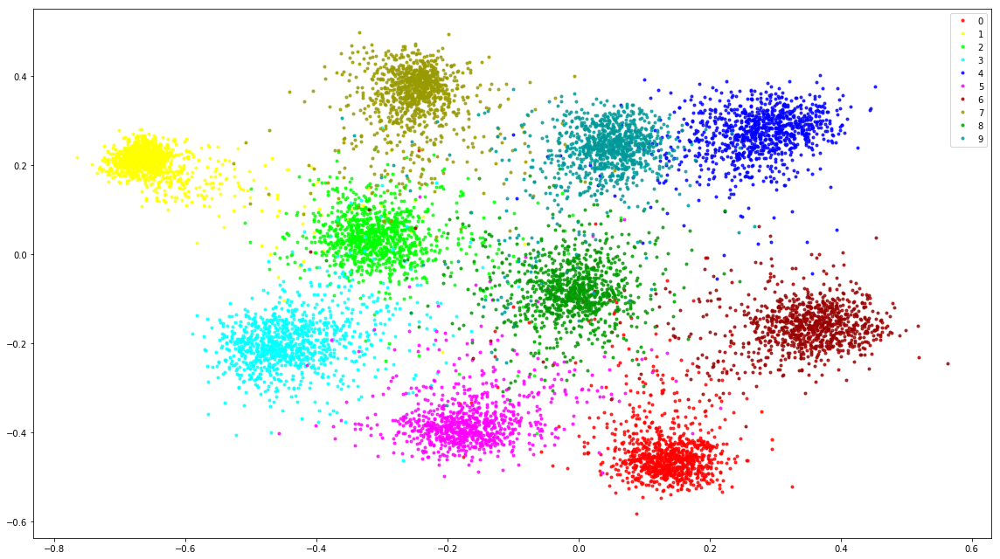

#900 - Loss 0.007148877
#901 - Loss 0.007954295
#902 - Loss 0.008258543
#903 - Loss 0.006814615
#904 - Loss 0.007965321
#905 - Loss 0.0062815966
#906 - Loss 0.0069750184
#907 - Loss 0.006931651
#908 - Loss 0.0067757964
#909 - Loss 0.0072174175
#910 - Loss 0.0069029788
#911 - Loss 0.007762248
#912 - Loss 0.008038012
#913 - Loss 0.0073716636
#914 - Loss 0.006637766
#915 - Loss 0.007107057
#916 - Loss 0.0074939043
#917 - Loss 0.0072685657
#918 - Loss 0.007425976
#919 - Loss 0.0067517566
#920 - Loss 0.007650474
#921 - Loss 0.007998598
#922 - Loss 0.008310226
#923 - Loss 0.007872915
#924 - Loss 0.0066970857
#925 - Loss 0.008144041
#926 - Loss 0.0073524322
#927 - Loss 0.0070343474
#928 - Loss 0.0069220983
#929 - Loss 0.00711239
#930 - Loss 0.007302037
#931 - Loss 0.0069496715
#932 - Loss 0.007930143
#933 - Loss 0.0074082487
#934 - Loss 0.008229927
#935 - Loss 0.0076423283
#936 - Loss 0.0071063447
#937 - Loss 0.007854951
#938 - Loss 0.007030481
#939 - Loss 0.008146618
#940 - Loss 0.006873883


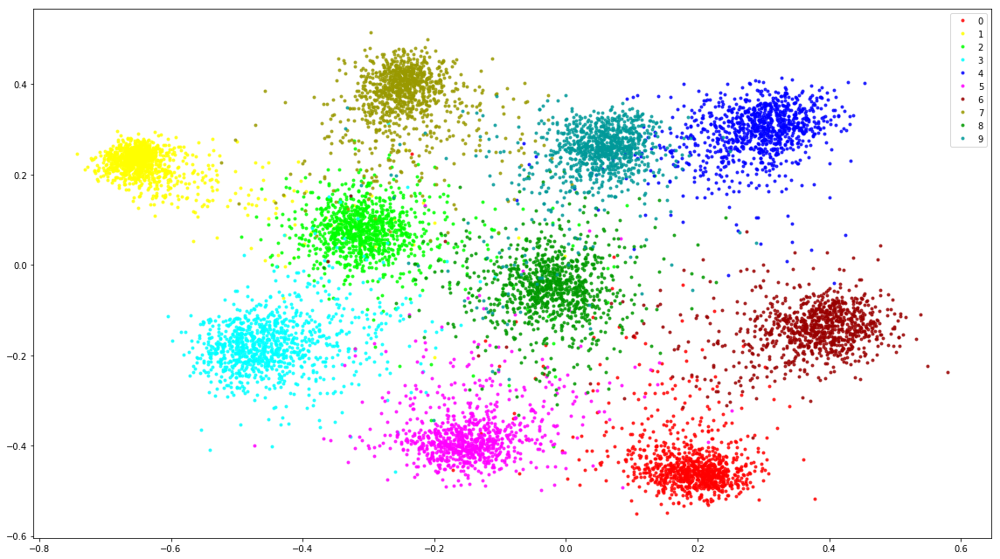

#950 - Loss 0.00892826
#951 - Loss 0.0067043225
#952 - Loss 0.0071146935
#953 - Loss 0.0066346726
#954 - Loss 0.006217689
#955 - Loss 0.0074667237
#956 - Loss 0.0061793774
#957 - Loss 0.007583721
#958 - Loss 0.006019244
#959 - Loss 0.0065142545
#960 - Loss 0.0071493112
#961 - Loss 0.006751173
#962 - Loss 0.0079225
#963 - Loss 0.008424241
#964 - Loss 0.007272972
#965 - Loss 0.0069847615
#966 - Loss 0.008070579
#967 - Loss 0.006682465
#968 - Loss 0.008714493
#969 - Loss 0.0073676687
#970 - Loss 0.007270292
#971 - Loss 0.006768575
#972 - Loss 0.007762886
#973 - Loss 0.0070861196
#974 - Loss 0.0075723934
#975 - Loss 0.006576142
#976 - Loss 0.007629444
#977 - Loss 0.0071385843
#978 - Loss 0.006386694
#979 - Loss 0.0076764277
#980 - Loss 0.007178925
#981 - Loss 0.007912596
#982 - Loss 0.0076229502
#983 - Loss 0.007523073
#984 - Loss 0.0068264697
#985 - Loss 0.007921849
#986 - Loss 0.007328588
#987 - Loss 0.007482233
#988 - Loss 0.0068457252
#989 - Loss 0.008037395
#990 - Loss 0.0065608034
#9

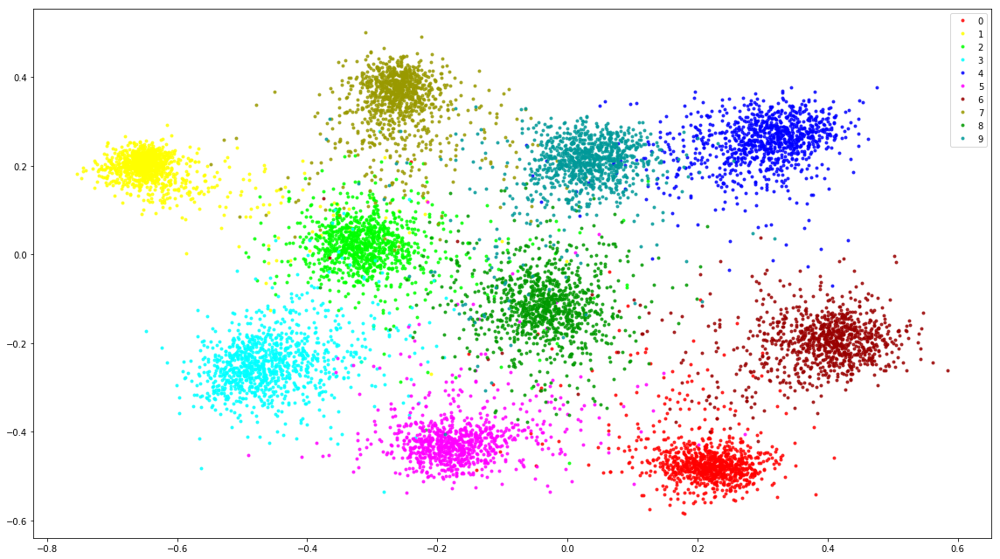

#1000 - Loss 0.007977352
#1001 - Loss 0.0070008393
#1002 - Loss 0.008275984
#1003 - Loss 0.007663728
#1004 - Loss 0.006178161
#1005 - Loss 0.007596465
#1006 - Loss 0.0070665465
#1007 - Loss 0.008115755
#1008 - Loss 0.0077938414
#1009 - Loss 0.0073986137
#1010 - Loss 0.0069389325
#1011 - Loss 0.007669338
#1012 - Loss 0.0060561686
#1013 - Loss 0.0076063955
#1014 - Loss 0.0075381906
#1015 - Loss 0.006621822
#1016 - Loss 0.0072641703
#1017 - Loss 0.0071882363
#1018 - Loss 0.0070461943
#1019 - Loss 0.0077710296
#1020 - Loss 0.0067262854
#1021 - Loss 0.0076210685
#1022 - Loss 0.0061770515
#1023 - Loss 0.007113383
#1024 - Loss 0.0064769876
#1025 - Loss 0.007240192
#1026 - Loss 0.0059424294
#1027 - Loss 0.0075155133
#1028 - Loss 0.007065204
#1029 - Loss 0.0067042694
#1030 - Loss 0.0066788387
#1031 - Loss 0.007084054
#1032 - Loss 0.0073826835
#1033 - Loss 0.007512944
#1034 - Loss 0.007762673
#1035 - Loss 0.0064689247
#1036 - Loss 0.007087181
#1037 - Loss 0.0065322258
#1038 - Loss 0.0069220657
#

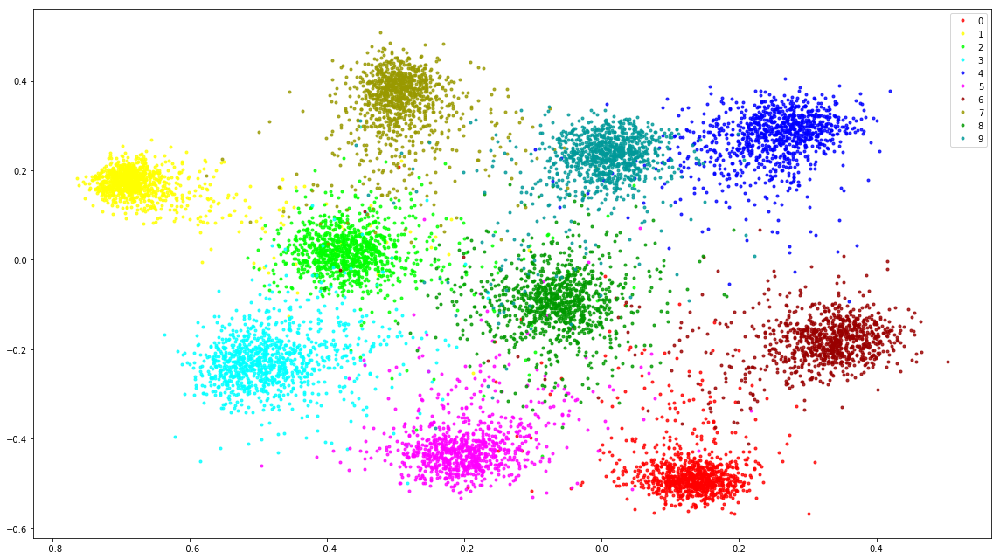

#1050 - Loss 0.0057479115
#1051 - Loss 0.006597836
#1052 - Loss 0.0069647925
#1053 - Loss 0.006852987
#1054 - Loss 0.0067986003
#1055 - Loss 0.007099526
#1056 - Loss 0.007083797
#1057 - Loss 0.0066789244
#1058 - Loss 0.0062045283
#1059 - Loss 0.0067024594
#1060 - Loss 0.0066815102
#1061 - Loss 0.0063258256
#1062 - Loss 0.006422691
#1063 - Loss 0.007020452
#1064 - Loss 0.006481121
#1065 - Loss 0.007701003
#1066 - Loss 0.0075225113
#1067 - Loss 0.0069898637
#1068 - Loss 0.006983583
#1069 - Loss 0.006768791
#1070 - Loss 0.008204879
#1071 - Loss 0.006125452
#1072 - Loss 0.0069097253
#1073 - Loss 0.0074757845
#1074 - Loss 0.006776122
#1075 - Loss 0.0065279556
#1076 - Loss 0.0068201628
#1077 - Loss 0.0071901362
#1078 - Loss 0.006005563
#1079 - Loss 0.006646474
#1080 - Loss 0.006773184
#1081 - Loss 0.0059986208
#1082 - Loss 0.006808913
#1083 - Loss 0.005768801
#1084 - Loss 0.007089978
#1085 - Loss 0.0068037636
#1086 - Loss 0.006154388
#1087 - Loss 0.0070190537
#1088 - Loss 0.0070468727
#1089 

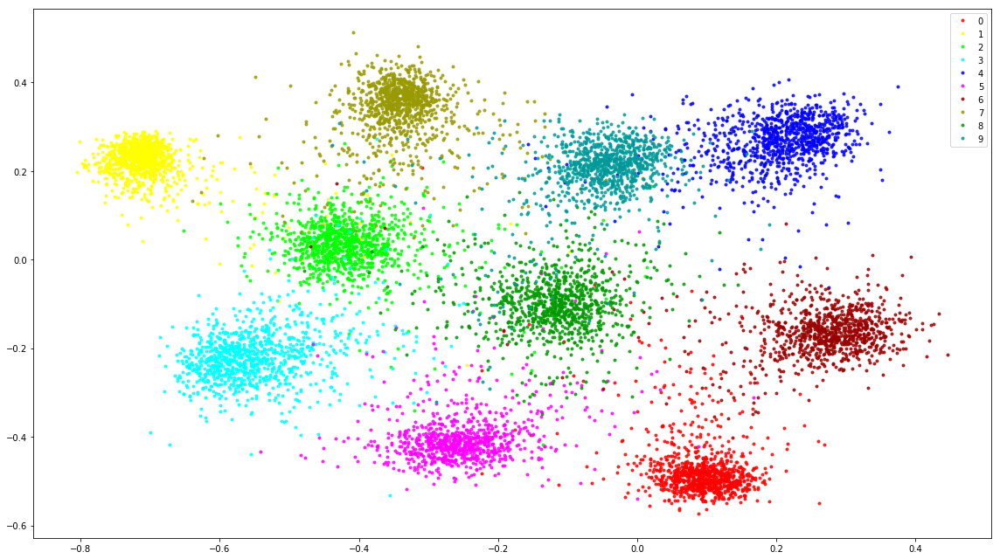

#1100 - Loss 0.0064072544
#1101 - Loss 0.0079816505
#1102 - Loss 0.0063399486
#1103 - Loss 0.006262325
#1104 - Loss 0.0064677424
#1105 - Loss 0.0066245846
#1106 - Loss 0.006525037
#1107 - Loss 0.005922761
#1108 - Loss 0.006583075
#1109 - Loss 0.006476839
#1110 - Loss 0.0067319525
#1111 - Loss 0.0071013384
#1112 - Loss 0.007966826
#1113 - Loss 0.006618576
#1114 - Loss 0.007385379
#1115 - Loss 0.007524922
#1116 - Loss 0.0068277693
#1117 - Loss 0.0064645084
#1118 - Loss 0.0066042924
#1119 - Loss 0.0070566596
#1120 - Loss 0.006753483
#1121 - Loss 0.0067513892
#1122 - Loss 0.0061780578
#1123 - Loss 0.006193333
#1124 - Loss 0.007255958
#1125 - Loss 0.0064072064
#1126 - Loss 0.006179493
#1127 - Loss 0.006550598
#1128 - Loss 0.0066367746
#1129 - Loss 0.0064632855
#1130 - Loss 0.006972372
#1131 - Loss 0.0065983576
#1132 - Loss 0.0073216422
#1133 - Loss 0.0073075625
#1134 - Loss 0.007037677
#1135 - Loss 0.0075685536
#1136 - Loss 0.0068013347
#1137 - Loss 0.006103058
#1138 - Loss 0.005625193
#113

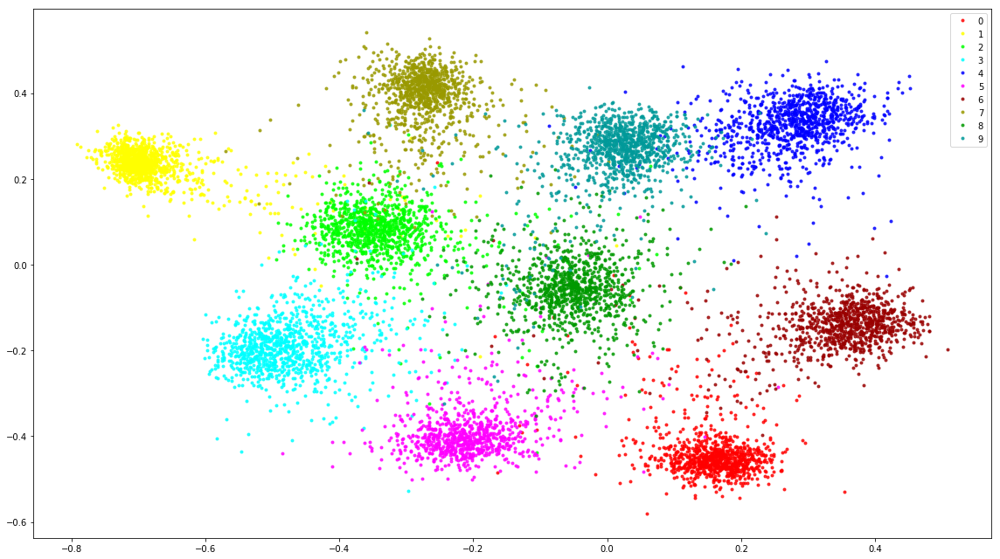

#1150 - Loss 0.0069146813
#1151 - Loss 0.0066034524
#1152 - Loss 0.0066145267
#1153 - Loss 0.0074602636
#1154 - Loss 0.0070321243
#1155 - Loss 0.007820254
#1156 - Loss 0.007611272
#1157 - Loss 0.007129932
#1158 - Loss 0.0072649
#1159 - Loss 0.006086752
#1160 - Loss 0.0072833644
#1161 - Loss 0.007187308
#1162 - Loss 0.0060444293
#1163 - Loss 0.006503226
#1164 - Loss 0.0066643823
#1165 - Loss 0.00709489
#1166 - Loss 0.0075911973
#1167 - Loss 0.0075707645
#1168 - Loss 0.0070945797
#1169 - Loss 0.0072596786
#1170 - Loss 0.0059353905
#1171 - Loss 0.0063501117
#1172 - Loss 0.0070593804
#1173 - Loss 0.007841718
#1174 - Loss 0.0065551787
#1175 - Loss 0.0070500276
#1176 - Loss 0.007353197
#1177 - Loss 0.006188413
#1178 - Loss 0.006893349
#1179 - Loss 0.006327821
#1180 - Loss 0.0072520035
#1181 - Loss 0.006355504
#1182 - Loss 0.0073663215
#1183 - Loss 0.0058782334
#1184 - Loss 0.0053436635
#1185 - Loss 0.0069345143
#1186 - Loss 0.006924687
#1187 - Loss 0.005874741
#1188 - Loss 0.0071041286
#1189

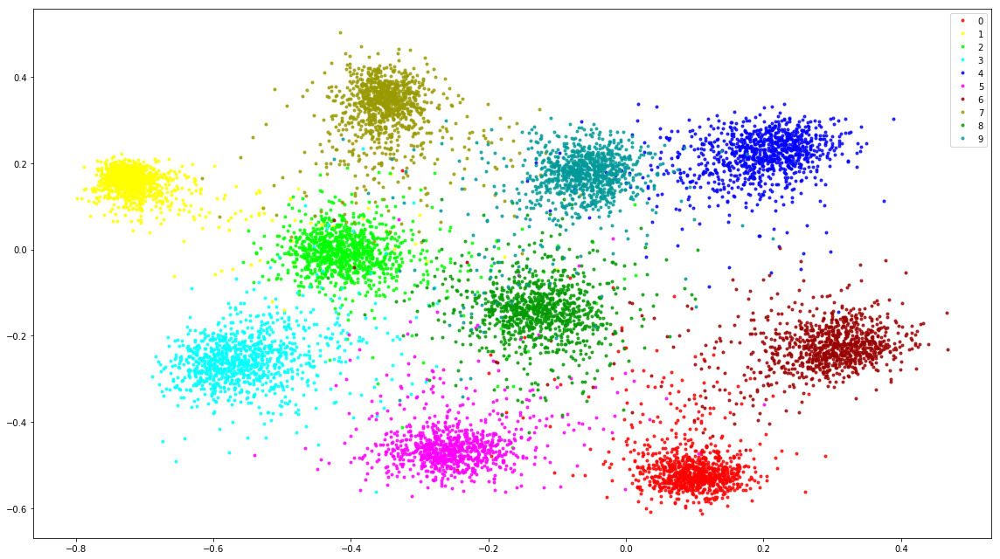

#1200 - Loss 0.005856279
#1201 - Loss 0.005515339
#1202 - Loss 0.0065498007
#1203 - Loss 0.006914626
#1204 - Loss 0.0062241987
#1205 - Loss 0.0068848496
#1206 - Loss 0.0066489815
#1207 - Loss 0.007418234
#1208 - Loss 0.006305614
#1209 - Loss 0.0068122894
#1210 - Loss 0.0062874993
#1211 - Loss 0.0065194806
#1212 - Loss 0.006217438
#1213 - Loss 0.007086423
#1214 - Loss 0.0058439667
#1215 - Loss 0.0053918418
#1216 - Loss 0.0069555487
#1217 - Loss 0.0060813143
#1218 - Loss 0.0060562254
#1219 - Loss 0.0068260324
#1220 - Loss 0.006001966
#1221 - Loss 0.0062211026
#1222 - Loss 0.006689151
#1223 - Loss 0.0068210433
#1224 - Loss 0.006696648
#1225 - Loss 0.006496436
#1226 - Loss 0.007898707
#1227 - Loss 0.00546252
#1228 - Loss 0.0061461623
#1229 - Loss 0.006160847
#1230 - Loss 0.0056779664
#1231 - Loss 0.007086975
#1232 - Loss 0.006115144
#1233 - Loss 0.0066378918
#1234 - Loss 0.006103165
#1235 - Loss 0.0050777383
#1236 - Loss 0.006702559
#1237 - Loss 0.006972789
#1238 - Loss 0.0061255177
#1239 

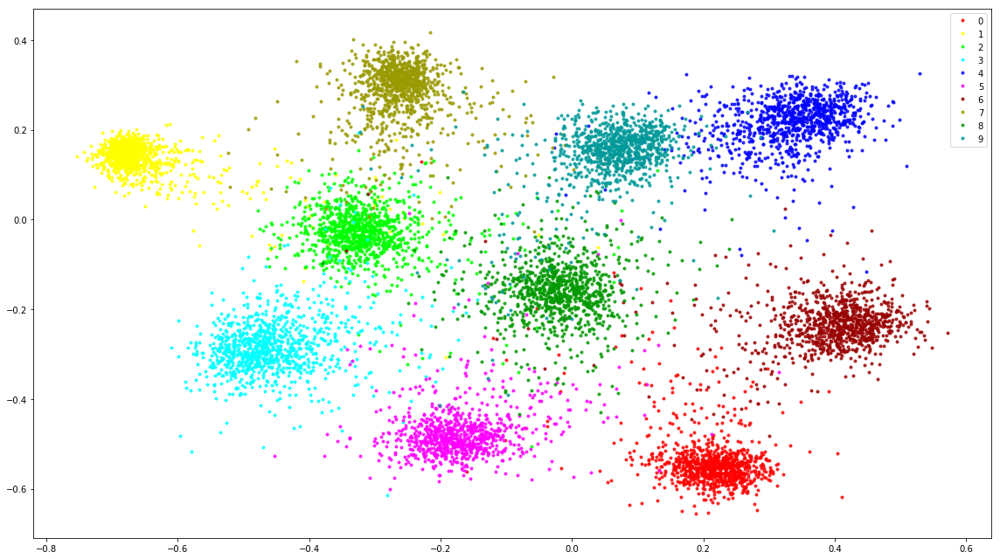

#1250 - Loss 0.0058690426
#1251 - Loss 0.006760263
#1252 - Loss 0.005810474
#1253 - Loss 0.0056063384
#1254 - Loss 0.006096434
#1255 - Loss 0.0060634045
#1256 - Loss 0.006728622
#1257 - Loss 0.006708723
#1258 - Loss 0.0062479544
#1259 - Loss 0.0060723973
#1260 - Loss 0.0068979748
#1261 - Loss 0.0069638374
#1262 - Loss 0.007943137
#1263 - Loss 0.0063848956
#1264 - Loss 0.0067859394
#1265 - Loss 0.006799444
#1266 - Loss 0.0071094763
#1267 - Loss 0.005788876
#1268 - Loss 0.006909308
#1269 - Loss 0.006330256
#1270 - Loss 0.0069497125
#1271 - Loss 0.0059735156
#1272 - Loss 0.006699041
#1273 - Loss 0.0064602974
#1274 - Loss 0.005930577
#1275 - Loss 0.0066602286
#1276 - Loss 0.0061506312
#1277 - Loss 0.005797842
#1278 - Loss 0.00622894
#1279 - Loss 0.0069244015
#1280 - Loss 0.006243454
#1281 - Loss 0.006767988
#1282 - Loss 0.0068031
#1283 - Loss 0.0066006407
#1284 - Loss 0.006062356
#1285 - Loss 0.005697938
#1286 - Loss 0.0052737235
#1287 - Loss 0.0061810296
#1288 - Loss 0.0059036096
#1289 - 

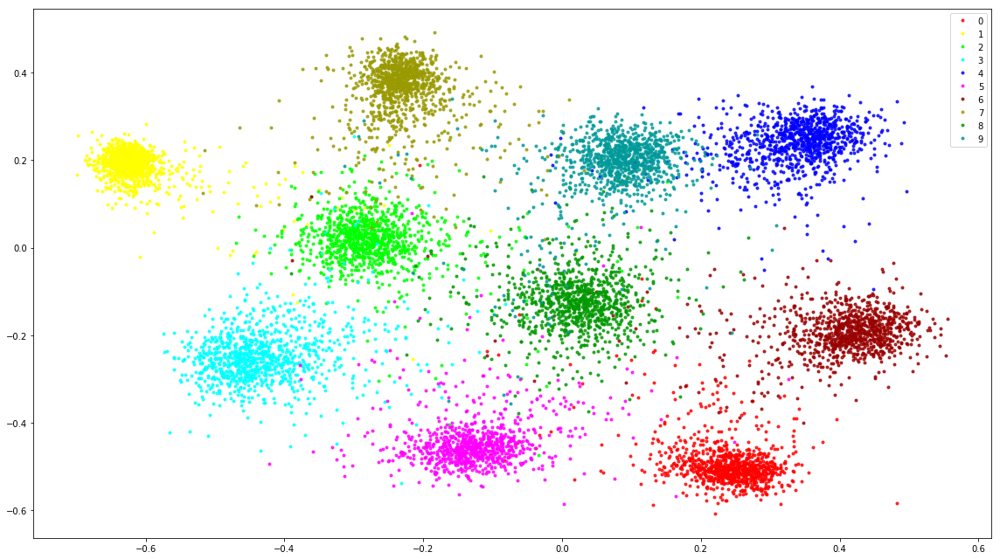

#1300 - Loss 0.0066615622
#1301 - Loss 0.005631464
#1302 - Loss 0.0059004184
#1303 - Loss 0.006431089
#1304 - Loss 0.0062198034
#1305 - Loss 0.005152094
#1306 - Loss 0.006391923
#1307 - Loss 0.006804034
#1308 - Loss 0.0062339734
#1309 - Loss 0.005751284
#1310 - Loss 0.005473224
#1311 - Loss 0.0062508495
#1312 - Loss 0.006247421
#1313 - Loss 0.0061874865
#1314 - Loss 0.0077036503
#1315 - Loss 0.0063635465
#1316 - Loss 0.005801171
#1317 - Loss 0.005128965
#1318 - Loss 0.0065766824
#1319 - Loss 0.006617763
#1320 - Loss 0.0059201503
#1321 - Loss 0.0051984484
#1322 - Loss 0.0061952034
#1323 - Loss 0.006969301
#1324 - Loss 0.0050734114
#1325 - Loss 0.006656262
#1326 - Loss 0.005122168
#1327 - Loss 0.006946332
#1328 - Loss 0.006459854
#1329 - Loss 0.006992014
#1330 - Loss 0.0059519084
#1331 - Loss 0.0061919834
#1332 - Loss 0.0070712776
#1333 - Loss 0.006885631
#1334 - Loss 0.0058739213
#1335 - Loss 0.007307709
#1336 - Loss 0.005809689
#1337 - Loss 0.005908469
#1338 - Loss 0.006266009
#1339 - 

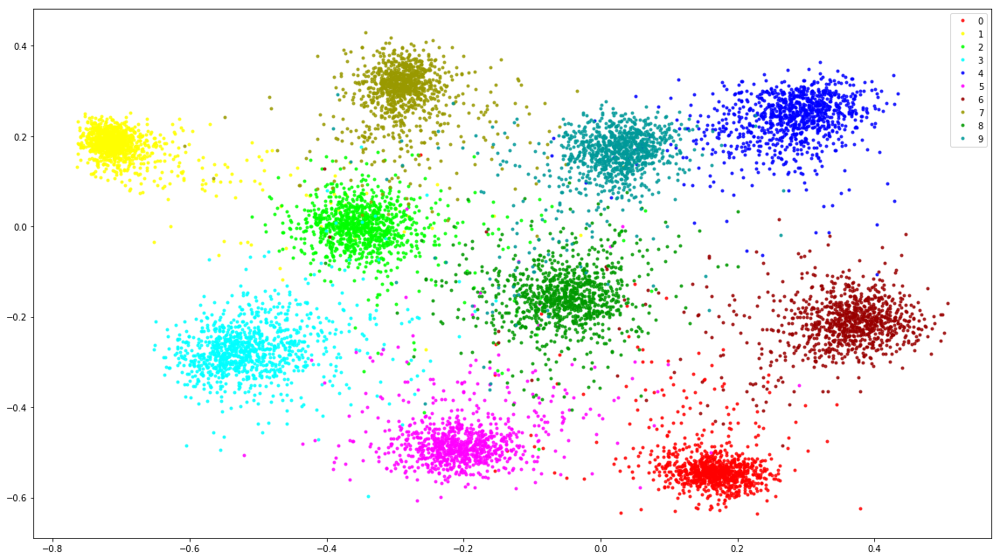

#1350 - Loss 0.0064024376
#1351 - Loss 0.005854864
#1352 - Loss 0.0057324064
#1353 - Loss 0.0060823965
#1354 - Loss 0.006557862
#1355 - Loss 0.0048728418
#1356 - Loss 0.0071848514
#1357 - Loss 0.0065722633
#1358 - Loss 0.006524329
#1359 - Loss 0.0062968223
#1360 - Loss 0.0061541824
#1361 - Loss 0.006048117
#1362 - Loss 0.0064273756
#1363 - Loss 0.0054947096
#1364 - Loss 0.0062126033
#1365 - Loss 0.007164284
#1366 - Loss 0.005361073
#1367 - Loss 0.0058528176
#1368 - Loss 0.005324113
#1369 - Loss 0.0071291868
#1370 - Loss 0.00777483
#1371 - Loss 0.00597642
#1372 - Loss 0.0069545843
#1373 - Loss 0.005635154
#1374 - Loss 0.0061094025
#1375 - Loss 0.005821377
#1376 - Loss 0.006617564
#1377 - Loss 0.0063014086
#1378 - Loss 0.005133492
#1379 - Loss 0.0057723843
#1380 - Loss 0.0061639342
#1381 - Loss 0.0071245194
#1382 - Loss 0.0059890766
#1383 - Loss 0.0061147744
#1384 - Loss 0.006690062
#1385 - Loss 0.0043005818
#1386 - Loss 0.0065992814
#1387 - Loss 0.006522431
#1388 - Loss 0.0058646854
#13

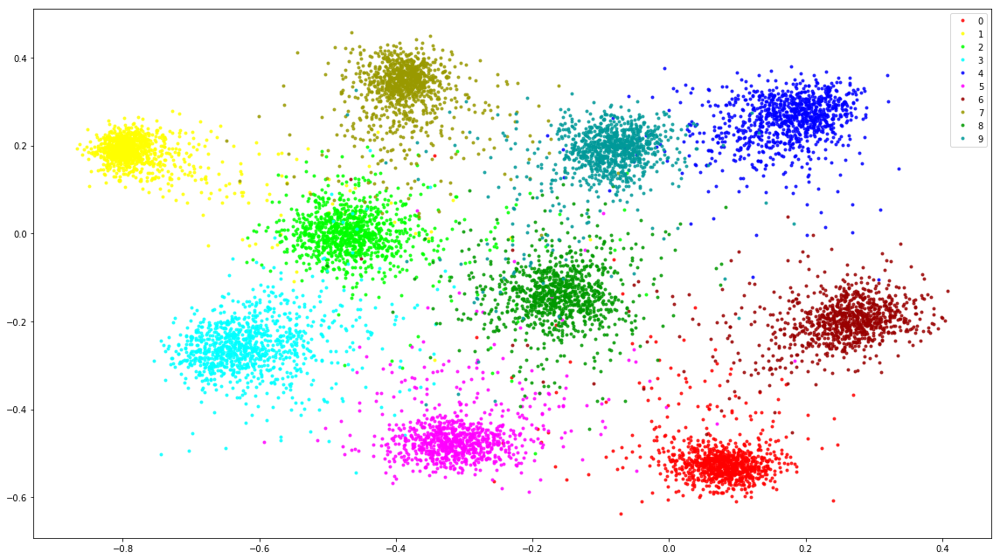

#1400 - Loss 0.005715902
#1401 - Loss 0.0068785306
#1402 - Loss 0.00605849
#1403 - Loss 0.0065329336
#1404 - Loss 0.005272812
#1405 - Loss 0.006097457
#1406 - Loss 0.0064627565
#1407 - Loss 0.0064398814
#1408 - Loss 0.0054147164
#1409 - Loss 0.006440639
#1410 - Loss 0.006622647
#1411 - Loss 0.0051025855
#1412 - Loss 0.0061628646
#1413 - Loss 0.0074030817
#1414 - Loss 0.006564697
#1415 - Loss 0.006570792
#1416 - Loss 0.0059823613
#1417 - Loss 0.005859437
#1418 - Loss 0.0060878983
#1419 - Loss 0.0059033134
#1420 - Loss 0.0053683976
#1421 - Loss 0.0066798395
#1422 - Loss 0.006398784
#1423 - Loss 0.0051860674
#1424 - Loss 0.0066114967
#1425 - Loss 0.0062801763
#1426 - Loss 0.006919247
#1427 - Loss 0.006615765
#1428 - Loss 0.006382536
#1429 - Loss 0.005917599
#1430 - Loss 0.0063401787
#1431 - Loss 0.0067051817
#1432 - Loss 0.006212083
#1433 - Loss 0.007139954
#1434 - Loss 0.006401188
#1435 - Loss 0.0055556213
#1436 - Loss 0.0060350285
#1437 - Loss 0.005783117
#1438 - Loss 0.0073563275
#1439

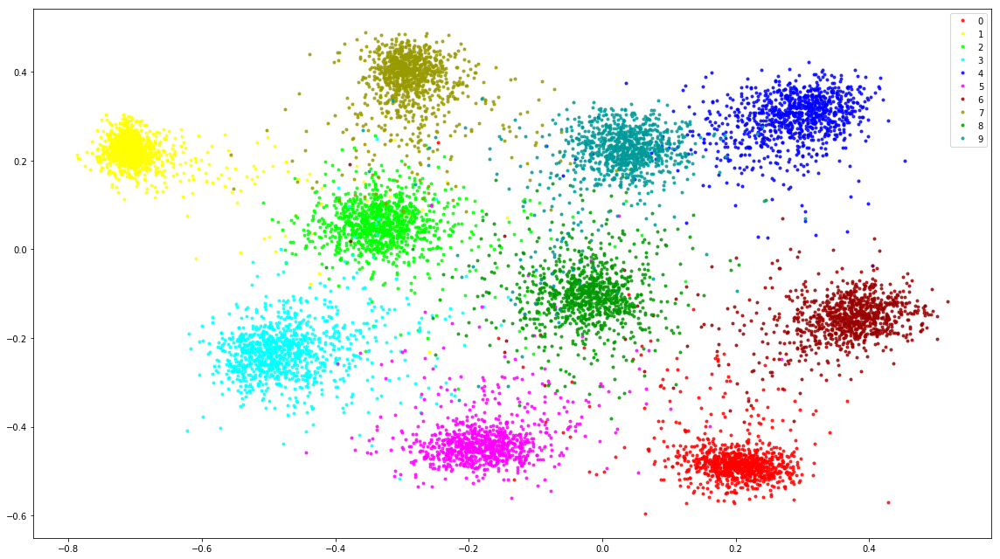

#1450 - Loss 0.005462286
#1451 - Loss 0.0059140516
#1452 - Loss 0.0063777254
#1453 - Loss 0.0051593594
#1454 - Loss 0.005750362
#1455 - Loss 0.004672399
#1456 - Loss 0.0068256273
#1457 - Loss 0.0070348913
#1458 - Loss 0.006007554
#1459 - Loss 0.005776819
#1460 - Loss 0.005858192
#1461 - Loss 0.00670592
#1462 - Loss 0.006325617
#1463 - Loss 0.006484373
#1464 - Loss 0.0066580162
#1465 - Loss 0.005562291
#1466 - Loss 0.0063934894
#1467 - Loss 0.006246988
#1468 - Loss 0.005713775
#1469 - Loss 0.0055693453
#1470 - Loss 0.0068978625
#1471 - Loss 0.0062698005
#1472 - Loss 0.0068714144
#1473 - Loss 0.0058719544
#1474 - Loss 0.004894227
#1475 - Loss 0.005998702
#1476 - Loss 0.004901115
#1477 - Loss 0.0063974615
#1478 - Loss 0.006120865
#1479 - Loss 0.006287289
#1480 - Loss 0.0055341413
#1481 - Loss 0.0072816107
#1482 - Loss 0.0064114453
#1483 - Loss 0.005287529
#1484 - Loss 0.0055844747
#1485 - Loss 0.005084887
#1486 - Loss 0.005602614
#1487 - Loss 0.0059610154
#1488 - Loss 0.005795208
#1489 - 

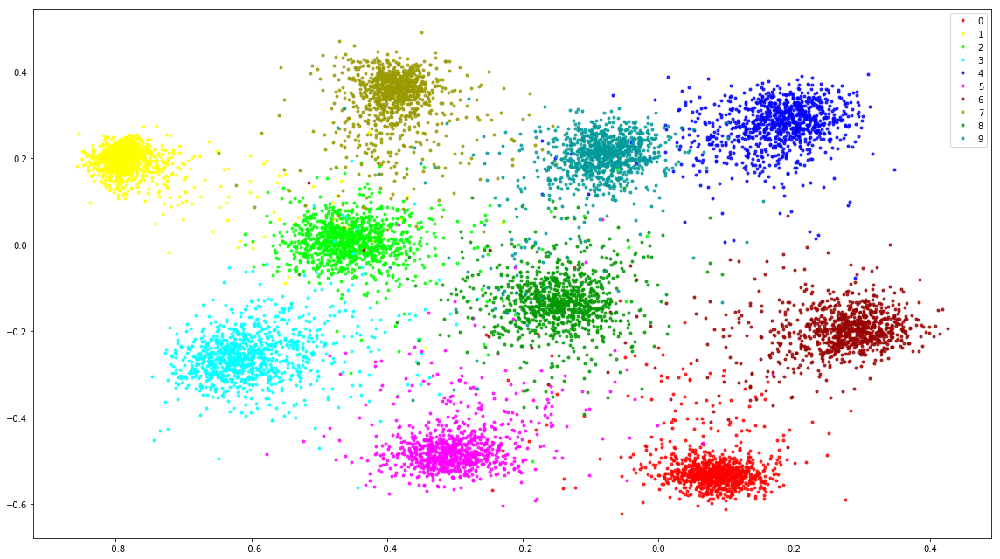

#1500 - Loss 0.005787275
#1501 - Loss 0.0060892794
#1502 - Loss 0.0062498082
#1503 - Loss 0.0066908635
#1504 - Loss 0.0060479473
#1505 - Loss 0.005316248
#1506 - Loss 0.006748137
#1507 - Loss 0.0054949718
#1508 - Loss 0.0072698765
#1509 - Loss 0.0053371084
#1510 - Loss 0.0059075826
#1511 - Loss 0.0063884747
#1512 - Loss 0.005538572
#1513 - Loss 0.0072071906
#1514 - Loss 0.006018101
#1515 - Loss 0.005553204
#1516 - Loss 0.0059036836
#1517 - Loss 0.005571396
#1518 - Loss 0.005566017
#1519 - Loss 0.004871971
#1520 - Loss 0.006484248
#1521 - Loss 0.00514706
#1522 - Loss 0.005378241
#1523 - Loss 0.0055991616
#1524 - Loss 0.00488688
#1525 - Loss 0.0058090063
#1526 - Loss 0.0055969786
#1527 - Loss 0.006530018
#1528 - Loss 0.006375228
#1529 - Loss 0.005402554
#1530 - Loss 0.005741067
#1531 - Loss 0.0065952586
#1532 - Loss 0.0061818017
#1533 - Loss 0.005475338
#1534 - Loss 0.0062601413
#1535 - Loss 0.0064034034
#1536 - Loss 0.0059556677
#1537 - Loss 0.0052602245
#1538 - Loss 0.0052511375
#1539 

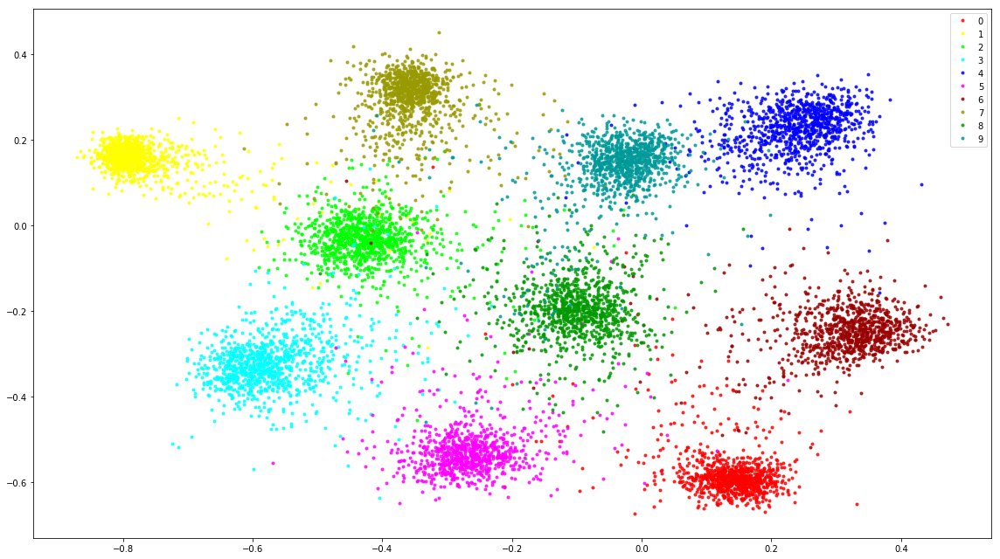

#1550 - Loss 0.0058675217
#1551 - Loss 0.006320065
#1552 - Loss 0.0057234205
#1553 - Loss 0.0058639576
#1554 - Loss 0.0053008455
#1555 - Loss 0.0061811535
#1556 - Loss 0.0057183467
#1557 - Loss 0.007079085
#1558 - Loss 0.005746578
#1559 - Loss 0.0063895723
#1560 - Loss 0.0058893296
#1561 - Loss 0.0056425985
#1562 - Loss 0.005087815
#1563 - Loss 0.0051182155
#1564 - Loss 0.0055324305
#1565 - Loss 0.005750284
#1566 - Loss 0.005965635
#1567 - Loss 0.005966031
#1568 - Loss 0.0066051325
#1569 - Loss 0.005556288
#1570 - Loss 0.0066552134
#1571 - Loss 0.0060898825
#1572 - Loss 0.0058761747
#1573 - Loss 0.0067277816
#1574 - Loss 0.0067625106
#1575 - Loss 0.0053705596
#1576 - Loss 0.00662559
#1577 - Loss 0.006253911
#1578 - Loss 0.005584375
#1579 - Loss 0.0071712756
#1580 - Loss 0.0057224575
#1581 - Loss 0.006043394
#1582 - Loss 0.0051584723
#1583 - Loss 0.0059415014
#1584 - Loss 0.0066419155
#1585 - Loss 0.004564852
#1586 - Loss 0.005375038
#1587 - Loss 0.005197089
#1588 - Loss 0.0052946243
#1

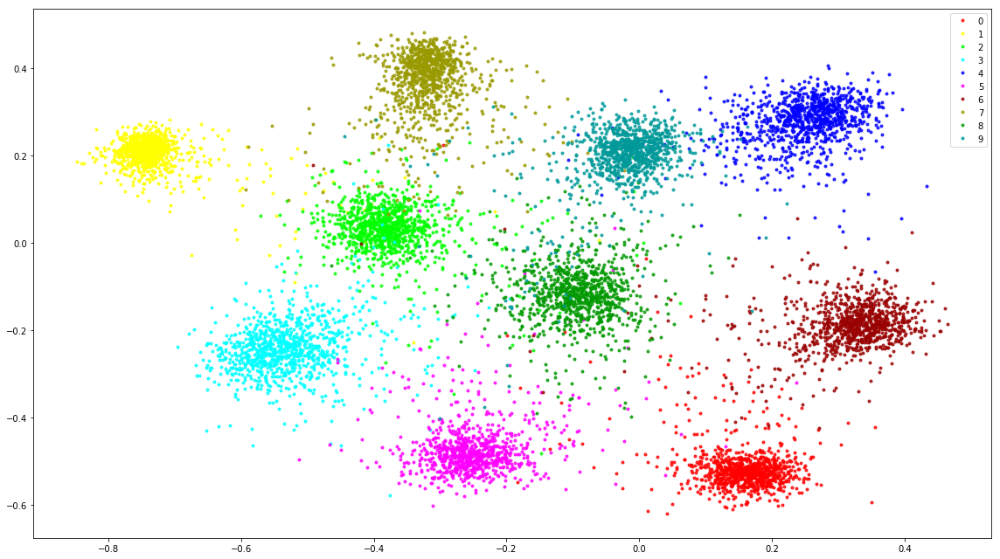

#1600 - Loss 0.0056672865
#1601 - Loss 0.006437123
#1602 - Loss 0.0054705273
#1603 - Loss 0.0048258766
#1604 - Loss 0.0056025377
#1605 - Loss 0.0049481513
#1606 - Loss 0.005321592
#1607 - Loss 0.005931882
#1608 - Loss 0.005723016
#1609 - Loss 0.006208486
#1610 - Loss 0.0050068772
#1611 - Loss 0.006341137
#1612 - Loss 0.005695886
#1613 - Loss 0.00552256
#1614 - Loss 0.0061954116
#1615 - Loss 0.0052879825
#1616 - Loss 0.004907649
#1617 - Loss 0.005814203
#1618 - Loss 0.006198952
#1619 - Loss 0.006065112
#1620 - Loss 0.0050795395
#1621 - Loss 0.0068848627
#1622 - Loss 0.00532176
#1623 - Loss 0.005623183
#1624 - Loss 0.005807848
#1625 - Loss 0.005845085
#1626 - Loss 0.0059560407
#1627 - Loss 0.0056824973
#1628 - Loss 0.005589527
#1629 - Loss 0.0054790974
#1630 - Loss 0.006332493
#1631 - Loss 0.0047946326
#1632 - Loss 0.004705444
#1633 - Loss 0.005539712
#1634 - Loss 0.0063963346
#1635 - Loss 0.005755841
#1636 - Loss 0.005637416
#1637 - Loss 0.005296592
#1638 - Loss 0.005214108
#1639 - Loss

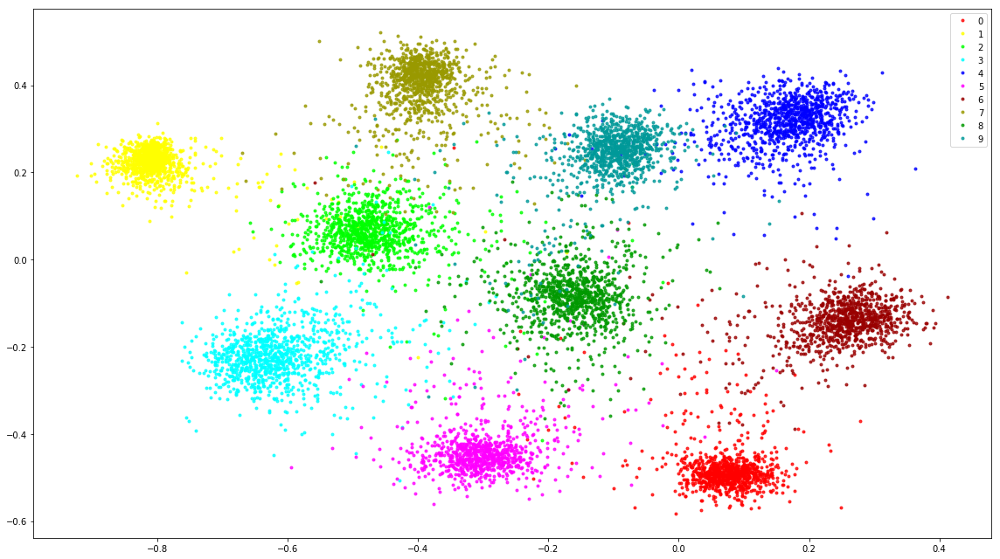

#1650 - Loss 0.004725202
#1651 - Loss 0.006632149
#1652 - Loss 0.0054049385
#1653 - Loss 0.0063655945
#1654 - Loss 0.0062056202
#1655 - Loss 0.005228188
#1656 - Loss 0.0050962474
#1657 - Loss 0.005984196
#1658 - Loss 0.006026466
#1659 - Loss 0.0053177862
#1660 - Loss 0.005440349
#1661 - Loss 0.005188794
#1662 - Loss 0.006086874
#1663 - Loss 0.006429457
#1664 - Loss 0.005708892
#1665 - Loss 0.005911786
#1666 - Loss 0.0064659934
#1667 - Loss 0.0058970894
#1668 - Loss 0.0055762306
#1669 - Loss 0.005537602
#1670 - Loss 0.00514073
#1671 - Loss 0.0058106673
#1672 - Loss 0.0053180275
#1673 - Loss 0.0058090785
#1674 - Loss 0.005873602
#1675 - Loss 0.005998706
#1676 - Loss 0.004865618
#1677 - Loss 0.005883309
#1678 - Loss 0.005160703
#1679 - Loss 0.006037566
#1680 - Loss 0.006234521
#1681 - Loss 0.0063826963
#1682 - Loss 0.0050007356
#1683 - Loss 0.005898089
#1684 - Loss 0.0057809968
#1685 - Loss 0.006015091
#1686 - Loss 0.0059616654
#1687 - Loss 0.0062385052
#1688 - Loss 0.0061716903
#1689 - L

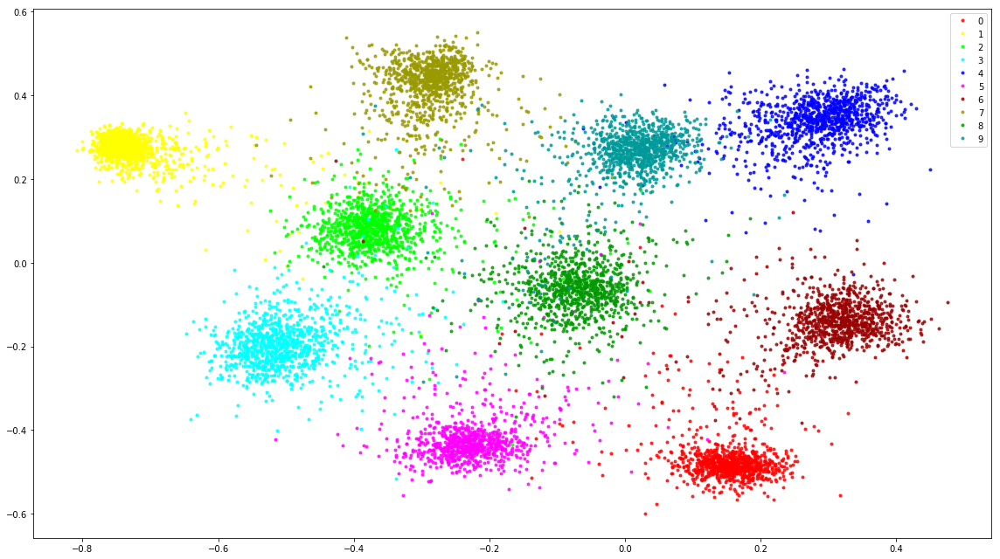

#1700 - Loss 0.0056873746
#1701 - Loss 0.005661994
#1702 - Loss 0.0062860926
#1703 - Loss 0.005179184
#1704 - Loss 0.0052643702
#1705 - Loss 0.005536828
#1706 - Loss 0.006018784
#1707 - Loss 0.0059166932
#1708 - Loss 0.0070964308
#1709 - Loss 0.0057040635
#1710 - Loss 0.006164816
#1711 - Loss 0.0054585757
#1712 - Loss 0.0047067204
#1713 - Loss 0.0056847124
#1714 - Loss 0.0060043107
#1715 - Loss 0.0069141546
#1716 - Loss 0.0058330474
#1717 - Loss 0.005794209
#1718 - Loss 0.0060391454
#1719 - Loss 0.005600652
#1720 - Loss 0.0064817974
#1721 - Loss 0.004796848
#1722 - Loss 0.005676307
#1723 - Loss 0.005303419
#1724 - Loss 0.0055713253
#1725 - Loss 0.005670251
#1726 - Loss 0.0060849744
#1727 - Loss 0.0050807227
#1728 - Loss 0.0050671403
#1729 - Loss 0.005164815
#1730 - Loss 0.0056772986
#1731 - Loss 0.006706404
#1732 - Loss 0.006462288
#1733 - Loss 0.0053056413
#1734 - Loss 0.005522427
#1735 - Loss 0.005913742
#1736 - Loss 0.0068354164
#1737 - Loss 0.0059661753
#1738 - Loss 0.005394887
#17

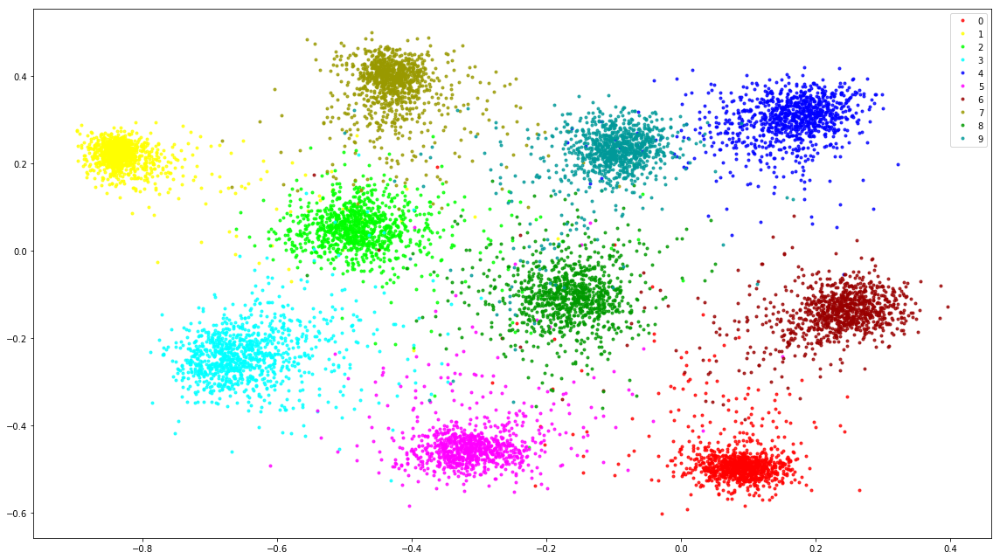

#1750 - Loss 0.005604944
#1751 - Loss 0.006321648
#1752 - Loss 0.006013268
#1753 - Loss 0.0052867
#1754 - Loss 0.005471634
#1755 - Loss 0.005550541
#1756 - Loss 0.0052335914
#1757 - Loss 0.0059126266
#1758 - Loss 0.005980745
#1759 - Loss 0.0052402513
#1760 - Loss 0.0055814344
#1761 - Loss 0.005642644
#1762 - Loss 0.004937748
#1763 - Loss 0.006258123
#1764 - Loss 0.0058724936
#1765 - Loss 0.004752489
#1766 - Loss 0.005414149
#1767 - Loss 0.004764714
#1768 - Loss 0.0047472627
#1769 - Loss 0.006095213
#1770 - Loss 0.005831837
#1771 - Loss 0.006534178
#1772 - Loss 0.0056398064
#1773 - Loss 0.005081179
#1774 - Loss 0.006449166
#1775 - Loss 0.004692557
#1776 - Loss 0.0058758245
#1777 - Loss 0.0053102076
#1778 - Loss 0.005684265
#1779 - Loss 0.0059403516
#1780 - Loss 0.005766407
#1781 - Loss 0.00640432
#1782 - Loss 0.0052905986
#1783 - Loss 0.0053652423
#1784 - Loss 0.0057161106
#1785 - Loss 0.005501303
#1786 - Loss 0.0048606507
#1787 - Loss 0.0065224525
#1788 - Loss 0.00531213
#1789 - Loss 0

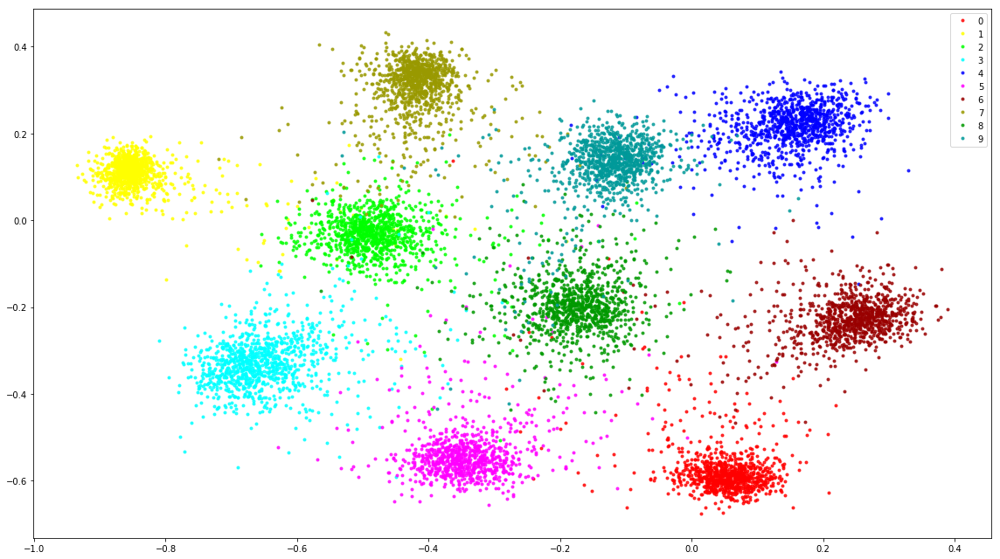

#1800 - Loss 0.006269505
#1801 - Loss 0.0060697775
#1802 - Loss 0.0055034105
#1803 - Loss 0.006393924
#1804 - Loss 0.004944969
#1805 - Loss 0.005765811
#1806 - Loss 0.005080016
#1807 - Loss 0.005937939
#1808 - Loss 0.0060660644
#1809 - Loss 0.0059331898
#1810 - Loss 0.006289204
#1811 - Loss 0.004924602
#1812 - Loss 0.005194527
#1813 - Loss 0.0055094063
#1814 - Loss 0.0058596116
#1815 - Loss 0.006007702
#1816 - Loss 0.005772571
#1817 - Loss 0.006386851
#1818 - Loss 0.0056206817
#1819 - Loss 0.0045972364
#1820 - Loss 0.005550643
#1821 - Loss 0.0057396763
#1822 - Loss 0.005044097
#1823 - Loss 0.0055028372
#1824 - Loss 0.006453895
#1825 - Loss 0.00543883
#1826 - Loss 0.0061465017
#1827 - Loss 0.0056272605
#1828 - Loss 0.006952185
#1829 - Loss 0.0045142956
#1830 - Loss 0.005158534
#1831 - Loss 0.005272681
#1832 - Loss 0.004639959
#1833 - Loss 0.004971888
#1834 - Loss 0.0058031064
#1835 - Loss 0.005970098
#1836 - Loss 0.0055257156
#1837 - Loss 0.005430662
#1838 - Loss 0.006744001
#1839 - Los

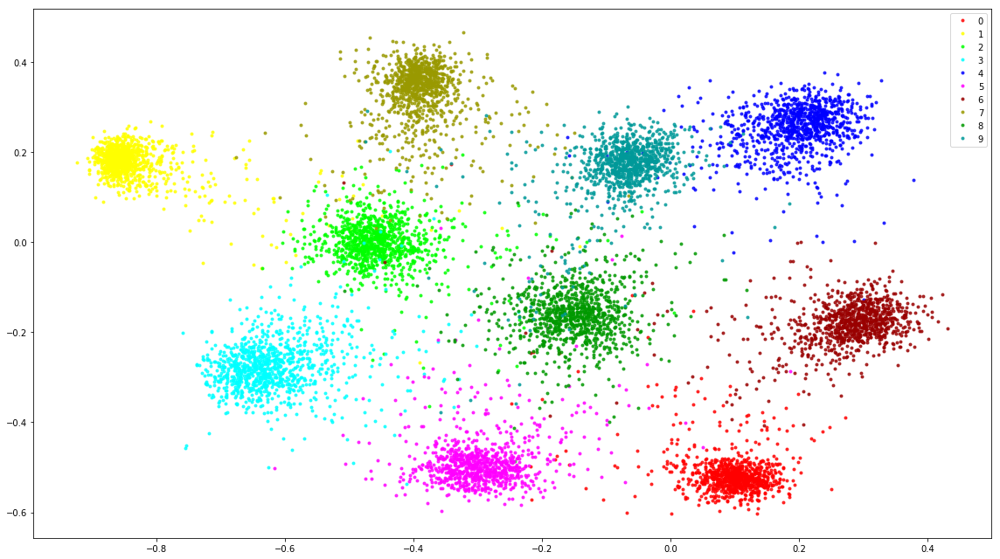

#1850 - Loss 0.005211799
#1851 - Loss 0.005062745
#1852 - Loss 0.005309266
#1853 - Loss 0.005327777
#1854 - Loss 0.005544636
#1855 - Loss 0.0044794576
#1856 - Loss 0.0058023017
#1857 - Loss 0.005669481
#1858 - Loss 0.0057983575
#1859 - Loss 0.005232165
#1860 - Loss 0.005198779
#1861 - Loss 0.005231576
#1862 - Loss 0.005659776
#1863 - Loss 0.0062435237
#1864 - Loss 0.005919775
#1865 - Loss 0.005438869
#1866 - Loss 0.0054931967
#1867 - Loss 0.005103602
#1868 - Loss 0.0047475677
#1869 - Loss 0.0051680263
#1870 - Loss 0.0055911597
#1871 - Loss 0.0048339935
#1872 - Loss 0.005385166
#1873 - Loss 0.0053221136
#1874 - Loss 0.00501661
#1875 - Loss 0.005316288
#1876 - Loss 0.00555769
#1877 - Loss 0.0048691807
#1878 - Loss 0.0043546665
#1879 - Loss 0.0060000895
#1880 - Loss 0.0046346397
#1881 - Loss 0.005230379
#1882 - Loss 0.005584244
#1883 - Loss 0.004702327
#1884 - Loss 0.0056011956
#1885 - Loss 0.004656131
#1886 - Loss 0.0051510604
#1887 - Loss 0.0057106265
#1888 - Loss 0.0048142867
#1889 - L

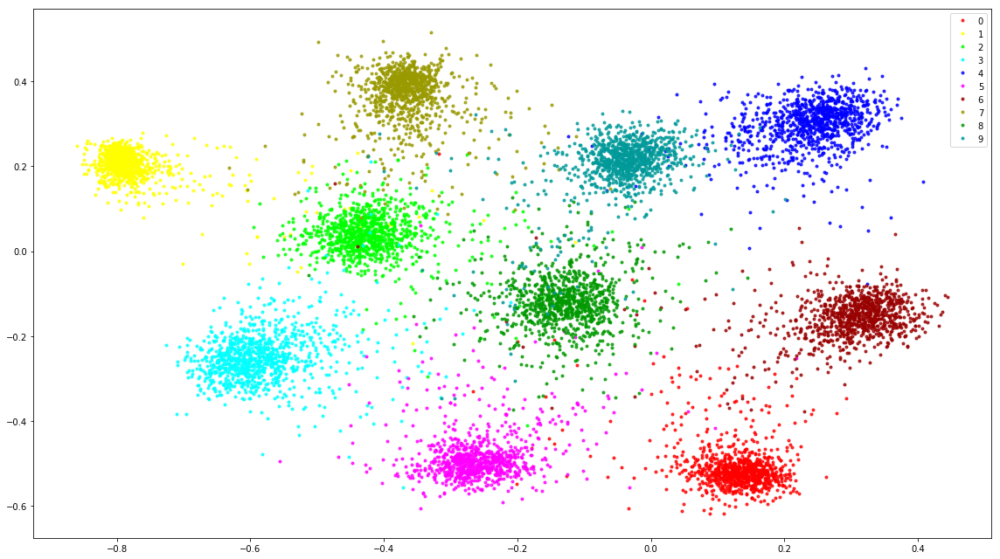

#1900 - Loss 0.005609692
#1901 - Loss 0.0045354106
#1902 - Loss 0.0048615946
#1903 - Loss 0.0051553664
#1904 - Loss 0.0051447703
#1905 - Loss 0.0053668665
#1906 - Loss 0.004758496
#1907 - Loss 0.0051547606
#1908 - Loss 0.0054572285
#1909 - Loss 0.004928918
#1910 - Loss 0.0049317596
#1911 - Loss 0.004812424
#1912 - Loss 0.005437805
#1913 - Loss 0.0059146476
#1914 - Loss 0.00519903
#1915 - Loss 0.004743087
#1916 - Loss 0.0054566404
#1917 - Loss 0.0048866845
#1918 - Loss 0.004794
#1919 - Loss 0.0058745854
#1920 - Loss 0.0066465065
#1921 - Loss 0.00459752
#1922 - Loss 0.0054870793
#1923 - Loss 0.0051347394
#1924 - Loss 0.0041698413
#1925 - Loss 0.0060888627
#1926 - Loss 0.0060800244
#1927 - Loss 0.005928807
#1928 - Loss 0.004313018
#1929 - Loss 0.005728938
#1930 - Loss 0.0054720966
#1931 - Loss 0.005722513
#1932 - Loss 0.0049320427
#1933 - Loss 0.0055794874
#1934 - Loss 0.005302585
#1935 - Loss 0.0051504713
#1936 - Loss 0.005777928
#1937 - Loss 0.006357531
#1938 - Loss 0.005742375
#1939 - 

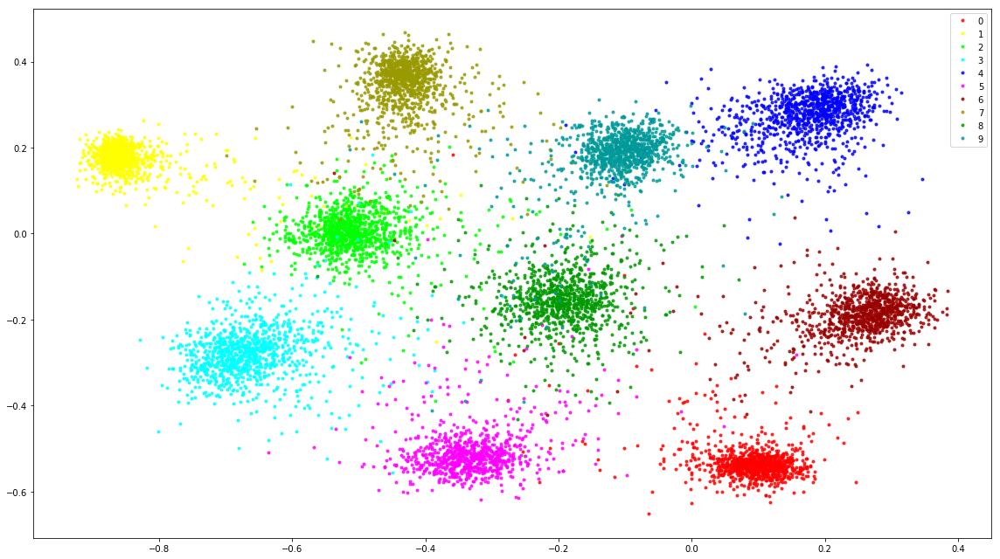

#1950 - Loss 0.0048671793
#1951 - Loss 0.00477193
#1952 - Loss 0.005665487
#1953 - Loss 0.0063092927
#1954 - Loss 0.0051524397
#1955 - Loss 0.005642957
#1956 - Loss 0.005582761
#1957 - Loss 0.0048480304
#1958 - Loss 0.00486674
#1959 - Loss 0.0050273617
#1960 - Loss 0.0060398644
#1961 - Loss 0.0058541754
#1962 - Loss 0.0063258545
#1963 - Loss 0.004722399
#1964 - Loss 0.0060164905
#1965 - Loss 0.0053774603
#1966 - Loss 0.0050042784
#1967 - Loss 0.0037292074
#1968 - Loss 0.0053742714
#1969 - Loss 0.005124591
#1970 - Loss 0.0065413653
#1971 - Loss 0.0062935613
#1972 - Loss 0.0051576407
#1973 - Loss 0.0053595025
#1974 - Loss 0.005320446
#1975 - Loss 0.0052302224
#1976 - Loss 0.0053682933
#1977 - Loss 0.0067289243
#1978 - Loss 0.005596337
#1979 - Loss 0.0045628175
#1980 - Loss 0.005536029
#1981 - Loss 0.004538686
#1982 - Loss 0.004163208
#1983 - Loss 0.0046103755
#1984 - Loss 0.0052139135
#1985 - Loss 0.0061773737
#1986 - Loss 0.0051847813
#1987 - Loss 0.005054962
#1988 - Loss 0.004446829
#1

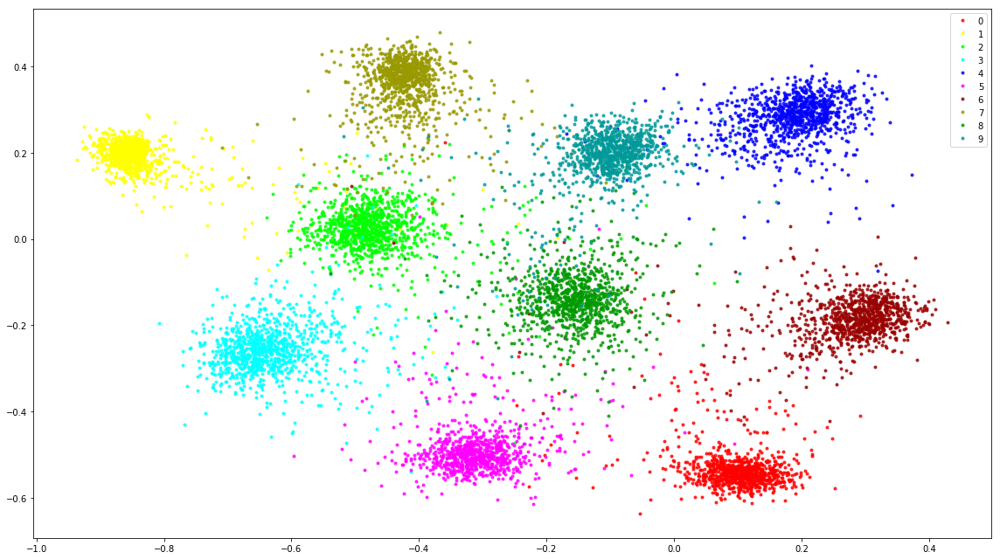

In [3]:
#from __future__ import generators, division, absolute_import, with_statement, print_function, unicode_literals

import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

#from dataset import MNISTDataset
#from model import *

flags = tf.app.flags
FLAGS = flags.FLAGS
flags.DEFINE_integer('batch_size', 512, 'Batch size.')
flags.DEFINE_integer('train_iter', 2000, 'Total training iter')
flags.DEFINE_integer('step', 50, 'Save after ... iteration')
flags.DEFINE_string('model', 'mnist', 'model to run')

tf.app.flags.DEFINE_string('f', '', 'kernel')

if __name__ == "__main__":
    #setup dataset
    if FLAGS.model == 'mnist':
        dataset = MNISTDataset()
        model = mnist_model
        placeholder_shape = [None] + list(dataset.images_train.shape[1:])
        print("placeholder_shape", placeholder_shape)
        colors = ['#ff0000', '#ffff00', '#00ff00', '#00ffff', '#0000ff', '#ff00ff', '#990000', '#999900', '#009900', '#009999']
    else:
        raise NotImplementedError("Model for %s is not implemented yet" % FLAGS.model)

    # Setup network
    next_batch = dataset.get_siamese_batch
    left = tf.placeholder(tf.float32, placeholder_shape, name='left')
    right = tf.placeholder(tf.float32, placeholder_shape, name='right')
    with tf.name_scope("similarity"):
        label = tf.placeholder(tf.int32, [None, 1], name='label') # 1 if same, 0 if different
        label_float = tf.to_float(label)
    margin = 0.5
    left_output = model(left, reuse=False)
    right_output = model(right, reuse=True)
    loss = contrastive_loss(left_output, right_output, label_float, margin)

    # Setup Optimizer
    global_step = tf.Variable(0, trainable=False)

    # starter_learning_rate = 0.0001
    # learning_rate = tf.train.exponential_decay(starter_learning_rate, global_step, 1000, 0.96, staircase=True)
    # tf.scalar_summary('lr', learning_rate)
    # train_step = tf.train.RMSPropOptimizer(learning_rate).minimize(loss, global_step=global_step)

    train_step = tf.train.MomentumOptimizer(0.01, 0.99, use_nesterov=True).minimize(loss, global_step=global_step)

    # Start Training
    saver = tf.train.Saver()
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())

        #setup tensorboard
        tf.summary.scalar('step', global_step)
        tf.summary.scalar('loss', loss)
        for var in tf.trainable_variables():
            tf.summary.histogram(var.op.name, var)
        merged = tf.summary.merge_all()
        writer = tf.summary.FileWriter('train.log', sess.graph)

        #train iter
        for i in range(FLAGS.train_iter):
            batch_left, batch_right, batch_similarity = next_batch(FLAGS.batch_size)

            _, l, summary_str = sess.run([train_step, loss, merged],
                                         feed_dict={left:batch_left, right:batch_right, label: batch_similarity})
            
            writer.add_summary(summary_str, i)
            print("\r#%d - Loss"%i, l)
            
            if (i + 1) % FLAGS.step == 0:
                #generate test
                # TODO: create a test file and run per batch
                feat = sess.run(left_output, feed_dict={left:dataset.images_test})
                
                labels = dataset.labels_test
                # plot result
                f = plt.figure(figsize=(16,9))
                f.set_tight_layout(True)
                for j in range(10):
                    plt.plot(feat[labels==j, 0].flatten(), feat[labels==j, 1].flatten(), '.', c=colors[j], alpha=0.8)
#                 plt.legend(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9'])
# #                 print(f"Savefig {i+1}")
# #                 plt.savefig('img/%d.jpg' % (i + 1))
                plt.show()

        saver.save(sess, "model/model.ckpt")
